# PyNeb's Handbook

## Introduction

PyNeb is a package for the analysis of emission lines, which evolved from the IRAF package nebular (Shaw and Dufour 1995; Shaw et al 1998). It is a library rather than a code: this means that, to use it, one has to write a python script or enter an interactive python session to call PyNeb classes and functions. In the following we'll provide some examples on how to use the different classes and functions.
Please note that the name of the code and the tarball are CapitalCase (PyNeb, PyNeb-[version-number]), whereas the module and directories are all lowercase (pyneb, pynebcore.py, etc).

References: Whenever you use PyNeb for calculations that lead to a published paper, you are kindly asked to cite the code as:

Luridiana, V., Morisset, C., & Shaw, R. A. 2015: PyNeb: a new tool for the analysis of emission lines.
I. Code description and validation of results, A&A, 573, 42

The paper is accessible at http://adsabs.harvard.edu/abs/2015A%26A...573A..42L

## Installation

### Requirements

To run PyNeb, you must have python v. 2.6 or above installed (but not python v. 3.n, which is a different python branch), plus the matplotlib, numpy and scipy libraries. Numpy minimum version is 1.5.1.

In [1]:
import numpy as np
print np.__version__

1.10.4


In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib
print matplotlib.__version__
import matplotlib.pyplot as plt
import matplotlib as mpl

1.5.1


### Installing the code with pip

This is the easiest way to install or upgrade PyNeb. You need to install pip first: get it from
http://pypi.python.org/pypi/pip and install it either using:

    sudo easy_install pip 

or following the instructions on the pip web page. Once pip is installed, enter from the command line:

    pip install --user pyneb 

to install PyNeb and:

    pip install --upgrade --user pyneb

for any subsequent upgrade. Uninstalling PyNeb is easy as well:

    pip uninstall pyneb

PyNeb's webpage at www.iac.es/proyecto/PyNeb contains a Troubleshooting page to address most frequent installation problems. 

### Installing the code from the tar file

Download the PyNeb package from the pypi site https://pypi.python.org/pypi/PyNeb. Unpack the PyNeb tarball in the directory of your choice, enter the directory PyNeb-[version-number], which is PyNeb's root directory and contains the following:

+ setup.py (a file, which is the package installer)
+ pyneb (a directory, which contains the source files)
+ PKG-INFO and README.txt  (information files)

To install the package, enter:

    python setup.py install --user

Once the package is installed, simply enter your favorite python interface (e.g., python or ipython) and start using PyNeb by inputting:

In [3]:
import pyneb as pn # We use the pn alias for PyNeb

(In the following, we will always assume that the PyNeb package has been imported under the alias “pn”.)

In [4]:
print pn.__version__

1.0.20


## First steps using PyNeb

A sketch of the organization of PyNeb can help to understand the role played by the different classes.

![PyNeb organisation](files/PN_organisation.jpg)

The main classes are __Atom__, __RecAtom__, __EmisGrid__, __Observations__, and __Diagnostics__. Some classes use other classes; for example, Atom is used in almost all the other classes. A detailed description of each class is given in the following, and the exhaustive list of all the methods of all the classes is available from the reference manual.

Please note: PyNeb uses the Object Oriented (OO) method of programming to define most of its features, but the scripts written as PyNeb wrappers need not be OO; they may follow the more classical functional or structured programming style.

## How atoms are represented: the Atom and RecAtom classes

PyNeb distinguishes between atoms emitting collisionally-excited lines (called here "collisional atoms") and atoms emitting recombination lines ("recombination atoms"). Both are represented as n-level systems and share the same basic syntax, but they are encoded in different classes and their internal representation is different in either case, as detailed in the following sections.

### The Atom class

The critical features of the physical atom relevant for our scope are encapsulated, for the collisional case, in the __Atom__ data structure. __Atom__ contains the way atomic data are read and managed to compute, for example, line emissivities and to determine diagnostics from line ratios, as well as ionic and total abundances.

Instantiation of the __Atom__ class to create an __Atom__ object is done by specifying an ion:

In [5]:
import pyneb as pn
O3 = pn.Atom('O', 3)

This command tells the code to create an O++ ion model (corresponding to the [O III] spectrum, hence the "3") by reading the [O III] atomic data. 

You can create (instantiate) as many atoms as you need, or even create atoms for the same ion using different atomic 
data. Some basic info on an existing Atom object can be retrieved by the print command:

In [6]:
print(O3)

Atom O3 from o_iii_atom_SZ00-WFD96.dat and o_iii_coll_AK99.dat


The two *.dat files mentioned contain the atomic data used to fill in the structure of this particular __Atom__ object. The organisation of these data files will be explained in the section on atomic data.

The __Atom__ object contains methods (functions) to explore it; for example you can display the ion's intrinsic properties:

In [7]:
O3.name

'oxygen'

In [8]:
O3.spec

3

In [9]:
O3.gs

'p2'

or the value of the data you are using, such as the energy of the fourth level in eV:

In [10]:
O3.getEnergy(4, unit='eV')

2.5135650188001009

The complete inventory of features and methods of the __Atom__ class can be displayed by entering:

In [11]:
print(dir(O3))

['AtomData', 'AtomHeader', 'CollData', 'EnergyNLevels', 'NIST', 'NLevels', '_A', '_Energy', '_StatWeight', '_Transition', '__class__', '__delattr__', '__dict__', '__doc__', '__format__', '__getattribute__', '__hash__', '__init__', '__module__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_getTemDen_1', '_getTemDen_MP', '_test_lev', 'atom', 'atomFile', 'atomFileType', 'atomFitsFile', 'atomFitsPath', 'atomNLevels', 'atomPath', 'calling', 'collFile', 'collFileType', 'collFitsFile', 'collFitsPath', 'collNLevels', 'collPath', 'elem', 'energy_Ryd', 'energy_eV', 'getA', 'getCollRates', 'getCritDensity', 'getDensityRange', 'getEmissivity', 'getEnergy', 'getHighDensRatio', 'getIonAbundance', 'getLowDensRatio', 'getOmega', 'getOmegaArray', 'getPopulations', 'getSources', 'getStatWeight', 'getTemArray', 'getTemDen', 'getTransition', 'gs', 'lineList', 'log_', 'name', 'plotEmiss', 'plotGrotrian', 'printIonic', 'pr

The various methods, which can be either public or private, are described in the PyNeb Reference Manual. Private methods have names starting with underscore “_” and are not supposed to be used by “standard” users.

As always, use the “?” from within an ipython session, or the __help__ method in any python session, or consult the User Reference Manual, to gain access to the different options of the methods:

In [12]:
help(O3.getEnergy)

Help on method getEnergy in module pyneb.core.pynebcore:

getEnergy(self, level=-1, unit='1/Ang') method of pyneb.core.pynebcore._AtomDataAscii instance
    Return energy level of selected level (or array of energy levels, if level not given) 
        in Angstrom^-1 (default) or another unit
    
    Usage:
        O3.getEnergy(4, unit='eV')
    Parameters:
        - level  selected atomic level (default= -1, returns complete array)
        - unit   [str] one of '1/Ang' (default), 'eV', or 'Ryd'



### Print and plot atomic properties

The __printIonic__ method displays informations on the atom's transitions:

In [13]:
O3.printIonic()

elem = O
spec = 3

warng Atom O3: Cannot print populations as tem or den is missing
warng Atom O3: Cannot print critical densities as tem is missing
     88.33m 
    (2-->1) 


     32.65m      51.80m 
    (3-->1)     (3-->2) 


   4931.23A    4958.91A    5006.84A 
    (4-->1)     (4-->2)     (4-->3) 


   2314.87A    2320.95A    2331.40A    4363.21A 
    (5-->1)     (5-->2)     (5-->3)     (5-->4) 


   1657.69A    1660.81A    1666.15A    2496.03A    5833.01A 
    (6-->1)     (6-->2)     (6-->3)     (6-->4)     (6-->5) 




Some arguments can be passed to the method to obtain more information:

In [14]:
O3.printIonic(tem=10000., den=1e3, printA=True, printPop=True, printCrit=True)

elem = O
spec = 3
temperature = 10000.0 K
density = 1000.0 cm-3

Level   Populations  Critical densities
Level 1:  3.150E-01  0.000E+00
Level 2:  4.888E-01  5.173E+02
Level 3:  1.961E-01  3.629E+03
Level 4:  4.252E-05  7.146E+05
Level 5:  2.933E-09  2.751E+07
Level 6:  2.407E-12  3.991E+10

2.620E-05   
     88.33m 
    (2-->1) 
  2.879E-22 

3.170E-11   9.760E-05   
     32.65m      51.80m 
    (3-->1)     (3-->2) 
  3.781E-28   7.337E-22 

2.410E-06   6.791E-03   2.046E-02   
   4931.23A    4958.91A    5006.84A 
    (4-->1)     (4-->2)     (4-->3) 
  4.127E-25   1.156E-21   3.451E-21 

0.000E+00   2.150E-01   6.340E-04   1.710E+00   
   2314.87A    2320.95A    2331.40A    4363.21A 
    (5-->1)     (5-->2)     (5-->3)     (5-->4) 
  0.000E+00   5.396E-24   1.584E-26   2.283E-23 

0.000E+00   2.200E+02   5.480E+02   4.740E-03   0.000E+00   
   1657.69A    1660.81A    1666.15A    2496.03A    5833.01A 
    (6-->1)     (6-->2)     (6-->3)     (6-->4)     (6-->5) 
  0.000E+00   6.334E-24  

Each block describes a transition: the transition probability (in s-1; first row), the wavelength of the corresponding emission line (in Angstrom or microns; second row), the two atomic levels (third row), and the emissivity of the line (fourth row).

You can plot the line emissivities using the following command:

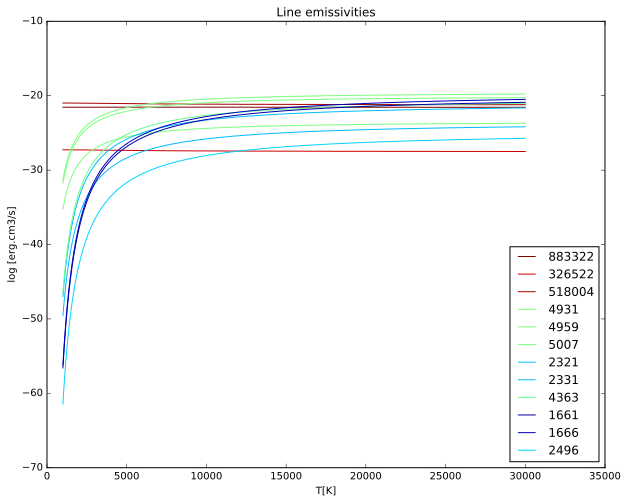

In [15]:
f, ax = plt.subplots(figsize=(10, 8))
O3.plotEmiss(tem_min=1000, tem_max=30000, ionic_abund=1.0, den=1e3, style='-', 
             legend_loc=4, temLog=False, plot_total=False, plot_only_total=False, 
             legend=True, total_color='black', total_label='TOTAL', ax=ax)

You can use then take advantage of matplotlib's plotting tools to zoom, crop, or move the figure as you need.

A Grotrian diagram of the ion (i.e., a plot of the energy levels and transition wavelengths) can be obtained using:

In [16]:
f, ax = plt.subplots(figsize=(10, 8))
O3.plotGrotrian(tem=1e4, den=1e2, thresh_int=1e-3, unit = 'eV', ax=ax)

The diagram can be tailored in various ways, zoomed in or saved into a file.

Atomic data are accessible using the following commands:

In [17]:
O3.getA()

array([[  0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00],
       [  2.61999990e-05,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00],
       [  3.17000000e-11,   9.76000010e-05,   0.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00],
       [  2.41000000e-06,   6.79099980e-03,   2.04600000e-02,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00],
       [  0.00000000e+00,   2.15000000e-01,   6.34000000e-04,
          1.71000000e+00,   0.00000000e+00,   0.00000000e+00],
       [  0.00000000e+00,   2.20000000e+02,   5.48000000e+02,
          4.73999980e-03,   0.00000000e+00,   0.00000000e+00]])

In [18]:
O3.getOmegaArray().shape # 6*6 levels, 20 temperatures

(6, 6, 20)

In [19]:
O3.getOmega(tem=1e4)

array([[ 0.     ,  0.     ,  0.     ,  0.     ,  0.     ,  0.     ],
       [ 0.5222 ,  0.     ,  0.     ,  0.     ,  0.     ,  0.     ],
       [ 0.2573 ,  1.232  ,  0.     ,  0.     ,  0.     ,  0.     ],
       [ 0.2434 ,  0.7302 ,  1.217  ,  0.     ,  0.     ,  0.     ],
       [ 0.0321 ,  0.09618,  0.1603 ,  0.5227 ,  0.     ,  0.     ],
       [ 0.1239 ,  0.3717 ,  0.6195 ,  0.     ,  0.     ,  0.     ]])

In [20]:
help(O3.getOmega)

Help on method getOmega in module pyneb.core.pynebcore:

getOmega(self, tem, lev_i=-1, lev_j=-1, wave=-1) method of pyneb.core.pynebcore.Atom instance
    Return interpolated value of the collision strength value at the given temperature 
        for the complete array or a specified transition.
    If kappa is not None (non-maxwellian distribution of e-velocities), the collision 
        strength is corrected as in Mendoza & Bautista, 2014 ApJ 785, 91.
    
    Usage:
        O3.getOmega(15000.)
        O3.getOmega([8e3, 1e4, 1.2e4])
        O3.getOmega([8e3, 1e4, 1.2e4], 5, 4)
    
    Parameters:
        - tem    electronic temperature in K. May be an array.
        - lev_i  upper level
        - lev_j  lower level



### Using Atom to compute populations and emissivities

The __Atom__ class is equipped with method which give access to the populations, emissivities, and other atomic quantities:

In [21]:
O3.getEnergy(4, unit='eV')

2.5135650188001009

In [22]:
O3.getStatWeight(level=4)

5.0

In [23]:
O3.getPopulations(tem=1e4, den=1e2)

array([  7.86836304e-01,   1.89131723e-01,   2.40277680e-02,
         4.20451605e-06,   2.89220138e-10,   2.37725298e-13])

In [24]:
O3.getCritDensity(tem=12000)

array([  0.00000000e+00,   5.51173034e+02,   3.81837469e+03,
         7.57552443e+05,   2.91357617e+07,   4.26266550e+10])

In [25]:
O3.getEmissivity(tem=1e4, den=1e2, wave=5007)

array(3.412033169270686e-21)

In [26]:
O3.getIonAbundance(int_ratio=100, tem=1.5e4, den=100., wave=5007)

1.0943418702999062e-05

Wavelengths should be entered with enough precision to avoid confusion with nearby lines. Use __printTransition__ to check if the transition selected by the code actually correponds to the one you intended: 

In [27]:
O3.printTransition(5007)

Input wave: 5007.0
Closest wave found: 5006.8
Relative error: 3E-05 
Transition: 4 -> 3


__getTransition__ is an abridged version which only returns the tuple of levels rather than an extended output, and is therefore apt to be used in scripts.

In addition to the wavelength, a transition can also be specified through its defining levels, as in:

In [28]:
O3.getIonAbundance(int_ratio=100, tem=1.5e4, den=100., lev_i = 4, lev_j=3)

1.0943418702999062e-05

In the case of __getEmissivity__, tem and den can be arrays. In such a case, if they have different dimensions N and M, the function will return an array of NxM emissivities corresponding to all tem-den combinations; if both arrays have the same dimension, you can obtain the emissivities of either the NxN array of tem-den combinations as in the previous case, or of the 1D, N-length array obtained pairing tem and den element by element. This is controlled by the “product” parameter:

In [29]:
O3.getEmissivity([10000, 12000], [100, 500], 4, 2, product=True)

array([[  1.14345463e-21,   1.15206397e-21],
       [  1.74604704e-21,   1.75668558e-21]])

In [30]:
O3.getEmissivity([10000, 12000], [100, 500], 4, 2, product=False)

array([  1.14345463e-21,   1.75668558e-21])

### Physical conditions determined from line ratios

The __Atom__ object also contains a method to compute the electron temperature or density given a line ratio:

In [31]:
O3.getTemDen(int_ratio=150., den=100., wave1=5007, wave2=4363)

10029.228788926666

The keyword tem (or den) specifies the supplied value of the temperature (or density). Which quantity is computed (temperature or density) is determined by which quantity is provided to the method: if “den” is given, then “tem” is computed, and vice versa.

If the intensity ratio is a simple ratio of two transitions, you can:

- either give the wavelengths of the two transitions involved: 

In [32]:
O3.getTemDen(0.02, den=1.e4,  wave1=4363, wave2=5007)

14876.907035306589

- or give the four levels that define the two transitions, in the following order: (upper level of numerator) (lower level of numerator) (upper level of denominator) (lower level of denominator); e. g.:

In [33]:
O3.getTemDen(0.02, den=1.e4, lev_i1=5, lev_j1=4, lev_i2=4, lev_j2=3)

14876.907035306589

In the general case of an intensity ratio formed by any number of transitions, an algebraic expression must be supplied as the argument of the keyword __to_eval__:

In [34]:
O3.getTemDen(0.02, den=1.e4, to_eval="I(5, 4) / (I(4, 3) + I(4, 2))" )

17133.865154187915

In [35]:
N2 = pn.Atom('N', 2)
N2.getTemDen(150., den=100., to_eval = "(L(6584) + L(6548)) / L(5755)")

8314.4744402712549

The __to_eval__ argument accepts either I(i, j) or L(wavelength) to identify the transitions involved in the diagnostic. Both can be mixed in the same string. If you do not know what transition corresponds to a given wavelength, use __printTransition__ to find it.

The parameters __tem__ and __den__, as well as the line ratio, may be arrays (1D or 2D, as in the case of observations obtained from IFUs), in which case the result will have the same shape. Some restrictions can be set to the domain explored by the method when looking for the solution; see the method's documentation for further details.

In [36]:
O3.getTemDen([0.02, 0.04], den=[1.e4, 1.1e4], to_eval="I(5, 4) / (I(4, 3) + I(4, 2))")

array([ 17133.86515419,  26908.34313925])

In [37]:
O3.getTemDen([0.02, 0.04], den=1.e4, to_eval="I(5, 4) / (I(4, 3) + I(4, 2))")

array([ 17133.86515419,  26976.0393771 ])

Notice that if you want to simultaneously determine both temperature and density combining two diagnostics (from two different atoms), you need to use the __getCrossTemDen__ method of the __Diagnostic__ class

### Ionic abundance determination

The ionic abundance is obtained from the intensity of a line normalized to Hbeta=100.

In [38]:
O3.getIonAbundance(int_ratio=100, tem=1.5e4, den=100., wave=5007)

1.0943418702999062e-05

### Creating a dictionary of Atom objects

You can define all the atoms at once and put them in a dictionary by creating each atom at a time through the commands:

In [39]:
O3 = pn.Atom('O', '3')
O2 = pn.Atom('O', '2')
N2 = pn.Atom('N', '2')

or rather use one of the following shortcuts:

In [40]:
atoms = pn.getAtomDict() # a method always requires parenthesis, even without argument

In [41]:
atoms # All the available atoms

{'3He2': Atom 3He2 from 3he_ii_atom_cloudy.dat and 3he_ii_coll_cloudy.dat,
 'Al2': Atom Al2 from al_ii_atom_JSP86-HK87-VVF96-KS86.dat and al_ii_coll_KHAF92-TBK85-TBK84.dat,
 'Ar2': Atom Ar2 from ar_ii_atom_Bal06.dat and ar_ii_coll_PB95.dat,
 'Ar3': Atom Ar3 from ar_iii_atom_M83-KS86.dat and ar_iii_coll_GMZ95.dat,
 'Ar4': Atom Ar4 from ar_iv_atom_MZ82.dat and ar_iv_coll_RB97.dat,
 'Ar5': Atom Ar5 from ar_v_atom_LL93-MZ82-KS86.dat and ar_v_coll_GMZ95.dat,
 'Ba2': Atom Ba2 from ba_ii_atom_C04.dat and ba_ii_coll_SB98.dat,
 'Ba4': Atom Ba4 from ba_iv_atom_BHQZ95.dat and ba_iv_coll_SB98.dat,
 'Br3': Atom Br3 from br_iii_atom_BH86.dat and br_iii_coll_S97.dat,
 'Br4': Atom Br4 from br_iv_atom_BH86.dat and br_iv_coll_S97.dat,
 'C1': Atom C1 from c_i_atom_FFS85.dat and c_i_coll_JBK87-PA76.dat,
 'C2': Atom C2 from c_ii_atom_GMZ98.dat and c_ii_coll_BP92.dat,
 'C3': Atom C3 from c_iii_atom_G83-NS78-WFD96.dat and c_iii_coll_Bal85.dat,
 'C4': Atom C4 from c_iv_atom_WFD96.dat and c_iv_coll_AK04.dat,
 

It is also possible to select only a subset of the elements or ions available by specifying the arguments __elem_list__ or __atom_list__:

In [42]:
atoms = pn.getAtomDict(elem_list=['C', 'N', 'O']) # all the ions with spectra from 1 to 6 are created

warng _ManageAtomicData: data for C5 not available
warng _ManageAtomicData: data for C5 not available
warng _ManageAtomicData: data for C6 not available
warng _ManageAtomicData: data for C6 not available
warng _ManageAtomicData: data for C7 not available
warng _ManageAtomicData: data for C7 not available
warng _ManageAtomicData: data for N5 not available
warng _ManageAtomicData: data for N5 not available
warng _ManageAtomicData: data for N6 not available
warng _ManageAtomicData: data for N6 not available
warng _ManageAtomicData: data for N7 not available
warng _ManageAtomicData: data for N7 not available
warng _ManageAtomicData: data for O6 not available
warng _ManageAtomicData: data for O6 not available
warng _ManageAtomicData: data for O7 not available
warng _ManageAtomicData: data for O7 not available


In [43]:
atoms # All the CNO available atoms

{'C1': Atom C1 from c_i_atom_FFS85.dat and c_i_coll_JBK87-PA76.dat,
 'C2': Atom C2 from c_ii_atom_GMZ98.dat and c_ii_coll_BP92.dat,
 'C3': Atom C3 from c_iii_atom_G83-NS78-WFD96.dat and c_iii_coll_Bal85.dat,
 'C4': Atom C4 from c_iv_atom_WFD96.dat and c_iv_coll_AK04.dat,
 'N1': Atom N1 from n_i_atom_KS86-WFD96.dat and n_i_coll_PA76-DMR76.dat,
 'N2': Atom N2 from n_ii_atom_GMZ97-WFD96.dat and n_ii_coll_T11.dat,
 'N3': Atom N3 from n_iii_atom_GMZ98.dat and n_iii_coll_BP92.dat,
 'N4': Atom N4 from n_iv_atom_WFD96.dat and n_iv_coll_RBHB94.dat,
 'O1': Atom O1 from o_i_atom_WFD96.dat and o_i_coll_BK95.dat,
 'O2': Atom O2 from o_ii_atom_Z82-WFD96.dat and o_ii_coll_P06-T07.dat,
 'O3': Atom O3 from o_iii_atom_SZ00-WFD96.dat and o_iii_coll_AK99.dat,
 'O4': Atom O4 from o_iv_atom_GMZ98.dat and o_iv_coll_BP92.dat,
 'O5': Atom O5 from o_v_atom_H80-NS79.dat and o_v_coll_BBDK85.dat}

In [44]:
atoms = pn.getAtomDict(atom_list=['O2', 'O3', 'Ar3', 'N2'])

In [45]:
atoms

{'Ar3': Atom Ar3 from ar_iii_atom_M83-KS86.dat and ar_iii_coll_GMZ95.dat,
 'N2': Atom N2 from n_ii_atom_GMZ97-WFD96.dat and n_ii_coll_T11.dat,
 'O2': Atom O2 from o_ii_atom_Z82-WFD96.dat and o_ii_coll_P06-T07.dat,
 'O3': Atom O3 from o_iii_atom_SZ00-WFD96.dat and o_iii_coll_AK99.dat}

In all these cases, a dictionary is created whose keys are the conventional atom names $<$element$><$spectrum$>$, and the corresponding entries the atoms themselves; e. g.:

In [46]:
atoms['N2']

Atom N2 from n_ii_atom_GMZ97-WFD96.dat and n_ii_coll_T11.dat

In [47]:
atoms['N2'].getEmissivity(tem=1e4, den=1e2, wave=6584)   # example of use

array(5.948363882838976e-21)

This can be useful if you need to loop on a list of atoms, to plot atomic data for example. To see what atoms have been created (which is limited by the data included in the selected atomic data set), enter:

In [48]:
atoms.keys()

['N2', 'Ar3', 'O3', 'O2']

If you want to be able to access them directly rather than through a dictionary, input from the command line:

In [49]:
for key in atoms.keys():
    vars()[key]=atoms[key]

and then you will be able to do the following:

In [50]:
Ar3.elem

'Ar'

## The atomic data

### Changing the data files used for atomic data

Since, for a given ion, there can be different calculations of atomic data with slightly (or not so slightly!) different results, more than one version of the data can exist for a given ion. The data are stored in and read from different types of files depending on the mechanism of line formation:

* In the case of recombination data, a single xxx_rec_XYZ.fits file contains the line emissivities, in a 2D temperature-density dependent table. 
* In the case of collisionally excited lines, the data are organized in different way depending on the file format:
    * The only data format admitted was, originally, fits (extension: .fits). Fits atomic data for a given ion are organized in two files (xxx here represents the ion [e.g., "o_iii" for O III] and XYZ is the acronym of the source paper(s)):
        * the xxx_atom_XYZ.fits file, containing the energies, the statistical weights and the transitions probabilities (the Einstein coefficients Aij)
        * the xxx_coll_XYZ.fits file, containing the temperature-dependent collision strengths.
    *  Since version 1.0.1, fits file have being totally replaced by plain ascii tables (extension .dat), which are organized as follows: 
        * xxx_levels.dat contain the energy levels and statistical weights. These file are downloaded from NIST and the source papers are encoded within the file and translated by PyNeb into an explicit bibliographic reference.
        * xxx_atom_XYZ.dat contain the transitions probabilities
        * xxx_coll_XYZ.fits contain the temperature-dependent collision strengths

Each of these file contains information for a finite number of levels N. Specifically, the energy levels and the statistical weights are arrays with N elements (one value per level), while the transition probability tables are triangular N*N matrices with zeros on the main diagonal (transition probabilities are different from zero only for (j -> i) transitions with  j > i).

This number is a feature of the particular atomic calculation, not an intrinsic feature of the physical atom, so that an Atom object created within PyNeb will have a number of levels NLevels equal to the number of levels of all the data used (or the minimum of them if either of the atom, coll or levels is different). 

You can access the NIST raw data by:

In [51]:
O3 = pn.Atom('O', 3)
O3.NIST

array([('2s2.2p2', '3P', 0.0, 0.0, 'L7288'),
       ('2s2.2p2', '3P', 1.0, 113.178, 'L7288'),
       ('2s2.2p2', '3P', 2.0, 306.174, 'L7288'),
       ('2s2.2p2', '1D', 2.0, 20273.27, 'L7288'),
       ('2s2.2p2', '1S', 0.0, 43185.74, 'L7288'),
       ('2s.2p3', '5S*', 2.0, 60324.79, 'L7288')], 
      dtype=[('conf', 'S23'), ('term', 'S9'), ('J', '<f8'), ('energy', '<f8'), ('ref', 'S10')])

You can access the full raw NIST data set by:

In [52]:
pn.utils.manage_atomic_data.getLevelsNIST('O2') #O2 is lighter than O3...

array([('2s2.2p3', '4S*', 1.5, 0.0, 'L11267'),
       ('2s2.2p3', '2D*', 2.5, 26810.55, 'L11267'),
       ('2s2.2p3', '2D*', 1.5, 26830.57, 'L11267'),
       ('2s2.2p3', '2P*', 1.5, 40468.01, 'L11267'),
       ('2s2.2p3', '2P*', 0.5, 40470.0, 'L11267'),
       ('2s.2p4', '4P', 2.5, 119837.21, 'L11267'),
       ('2s.2p4', '4P', 1.5, 120000.43, 'L11267'),
       ('2s.2p4', '4P', 0.5, 120082.86, 'L11267'),
       ('2s.2p4', '2D', 2.5, 165988.46, 'L11267'),
       ('2s.2p4', '2D', 1.5, 165996.5, 'L11267'),
       ('2s2.2p2.(3P).3s', '4P', 0.5, 185235.281, 'L11267'),
       ('2s2.2p2.(3P).3s', '4P', 1.5, 185340.577, 'L11267'),
       ('2s2.2p2.(3P).3s', '4P', 2.5, 185499.124, 'L11267'),
       ('2s2.2p2.(3P).3s', '2P', 0.5, 188888.543, 'L11267'),
       ('2s2.2p2.(3P).3s', '2P', 1.5, 189068.514, 'L11267'),
       ('2s.2p4', '2S', 0.5, 195710.47, 'L11267'),
       ('2s2.2p2.(3P).3p', '2S*', 0.5, 203942.288, 'L11267'),
       ('2s2.2p2.(3P).3p', '4D*', 0.5, 206730.762, 'L11267'),
       ('2s2

You can print the name of the atomic data used for a given ion with:

In [53]:
print(O3.atomFile)

o_iii_atom_SZ00-WFD96.dat


In [54]:
print(O3.collFile)

o_iii_coll_AK99.dat


As the files can be located in different directories, you may also find useful to print out the path:

In [55]:
print(O3.atomPath)
print(O3.collPath)

/home/morisset/anaconda2/lib/python2.7/site-packages/pyneb/utils/../atomic_data/
/home/morisset/anaconda2/lib/python2.7/site-packages/pyneb/utils/../atomic_data/


A set of data files for a given group of ions is called a data set. The default data set (or the adopted data set, if a different one has been set) can be displayed with the command:

In [56]:
pn.atomicData.getDataFile()

{'3He2': {'atom': '3he_ii_atom_cloudy.dat', 'coll': '3he_ii_coll_cloudy.dat'},
 'Al2': {'atom': 'al_ii_atom_JSP86-HK87-VVF96-KS86.dat',
  'coll': 'al_ii_coll_KHAF92-TBK85-TBK84.dat'},
 'Ar2': {'atom': 'ar_ii_atom_Bal06.dat', 'coll': 'ar_ii_coll_PB95.dat'},
 'Ar3': {'atom': 'ar_iii_atom_M83-KS86.dat', 'coll': 'ar_iii_coll_GMZ95.dat'},
 'Ar4': {'atom': 'ar_iv_atom_MZ82.dat', 'coll': 'ar_iv_coll_RB97.dat'},
 'Ar5': {'atom': 'ar_v_atom_LL93-MZ82-KS86.dat',
  'coll': 'ar_v_coll_GMZ95.dat'},
 'Ba2': {'atom': 'ba_ii_atom_C04.dat', 'coll': 'ba_ii_coll_SB98.dat'},
 'Ba4': {'atom': 'ba_iv_atom_BHQZ95.dat', 'coll': 'ba_iv_coll_SB98.dat'},
 'Br3': {'atom': 'br_iii_atom_BH86.dat', 'coll': 'br_iii_coll_S97.dat'},
 'Br4': {'atom': 'br_iv_atom_BH86.dat', 'coll': 'br_iv_coll_S97.dat'},
 'C1': {'atom': 'c_i_atom_FFS85.dat', 'coll': 'c_i_coll_JBK87-PA76.dat'},
 'C2': {'atom': 'c_ii_atom_GMZ98.dat', 'coll': 'c_ii_coll_BP92.dat'},
 'C3': {'atom': 'c_iii_atom_G83-NS78-WFD96.dat',
  'coll': 'c_iii_coll_Bal85

while the data files set for a particular ion can be displayed by providing an argument to the above; e.g. for [SIV]:

In [57]:
pn.atomicData.getDataFile('S4')

warng _ManageAtomicData: rec data not available for S4
warng _ManageAtomicData: trc data not available for S4


('s_iv_atom_JKD86-DHKD82.dat', 's_iv_coll_DHKD82.dat', None, None)

The complete inventory of data available for a given ion can be displayed with the command:

In [58]:
pn.atomicData.getAllAvailableFiles('O2')

['o_ii_atom.chianti',
 'o_ii_atom_FFT04.dat',
 'o_ii_atom_WFD96.dat',
 'o_ii_atom_Z82-WFD96.dat',
 'o_ii_coll.chianti',
 'o_ii_coll_Kal09.dat',
 'o_ii_coll_P06-T07.dat',
 'o_ii_coll_P76-McLB93-v1.dat',
 'o_ii_coll_P76-McLB93-v2.dat',
 'o_ii_coll_T07.dat']

This method looks for all the “o\_ii\_*” files in a set of paths which includes the location of the atomic data provided with the package and the current directory (the one from where the python session is running); additional paths can be added with the following command:

In [59]:
pn.atomicData.addDataFilePath("/tmp")

When both a .dat and a .fits version of the same data are found, the .fits files are ignored, but you can force PyNeb to include them by running the command:

In [60]:
pn.atomicData.includeFitsPath()

If you want to change the atomic data used for a given ion, use the following command to point to an existing data file:

In [61]:
pn.atomicData.setDataFile('s_iii_coll_HRS12.fits')

If you want to change several data files at once, it may be worth defining a dictionary with all your preferred atomic data files within your script:

In [62]:
DataFileDict = {'N1': {'atom': 'n_i_atom_KS86-WFD96.dat', 'coll': 'n_i_coll_PA76-DMR76.dat'},
                'N2': {'atom': 'n_ii_atom_GMZ97-WFD96.dat', 'coll': 'n_ii_coll_LB94.dat'},
                'O2': {'atom': 'o_ii_atom_Z82-WFD96.dat', 'coll': 'o_ii_coll_P06-T07.dat'},
                'O3': {'atom': 'o_iii_atom_FFT04-SZ00.dat', 'coll': 'o_iii_coll_AK99.dat'},
                'Ne3': {'atom': 'ne_iii_atom_GMZ97.dat', 'coll': 'ne_iii_coll_McLB00.dat'}}          	
pn.atomicData.setDataFileDict(DataFileDict)

Make sure that all the files listed actually exist, as this is not checked by the code.

### Predefined sets of atomic data

Predefined atomic data sets are provided by PyNeb. Each data set is identified by a label; the one of the default data set can be retrieved by the following command:

In [63]:
pn.atomicData.defaultDict

'PYNEB_14_03'

To display the complete list of the existing predefined dictionaries, enter: 

In [64]:
pn.atomicData.getAllPredefinedDict()

['PYNEB_14_01',
 'PYNEB_16_01',
 'IRAF_09',
 'PYNEB_14_02',
 'PYNEB_14_03',
 'PYNEB_13_01',
 'IRAF_09_orig']

The following command can be used to set one of them:

In [65]:
pn.atomicData.setDataFileDict("IRAF_09")

To revert to the default set:

In [66]:
pn.atomicData.resetDataFileDict()
pn.atomicData.removeFitsPath()

You can have a look at the other methods of pn.atomicData in the Reference Manual, or using the __help__ command.

### Creating new atomic data files

The following is an example of a 6-level atom file of [O III], containing the matrix of transition probabilities. The energy levels and statistical weigths are not in this file.

Aij  
1/s 1/s 1/s 1/s 1/s 1/s  
0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00  
2.5960000e-05 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00  
3.0300000e-11 9.6320000e-05 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00  
2.3220000e-06 6.9510000e-03 2.0290000e-02 0.0000000e+00 0.0000000e+00 0.0000000e+00  
0.0000000e+00 2.2550000e-01 6.9980000e-04 1.6850000e+00 0.0000000e+00 0.0000000e+00  
2.1910000e-03 2.3080000e+02 5.7650000e+02 5.7770000e-03 3.7600000e-11 0.0000000e+00  
\*\*\* ATOM oxygen  
\*\*\* SPECTRUM 3  
\*\*\* GSCONFIG unknown  
\*\*\* SOURCE3 Froese Fischer et al 2004, ADNDT 87, 1  
\*\*\* NOTE3 A-values from all levels  

The effective collision strengths are a function of electron temperature (a collective property of the electron distribution) and are obtained as the average over a Maxwellian distribution of the collision strengths, which depend on the energy. (Note: in this document, we will often refer to the effective collision strengths as collision strengths for short, although this is not strictly correct.) They are usually published for a handful of T values and must be interpolated to get the collision strength at the desired values. As a result, there is a whole 1-D array of collision strengths, with one element for each tabulated temperature value, for each transition j -> i  with j > i. The existence of this 3rd dimension prevents the data from being simply stored in a matrix as transition probabilities are. Instead, each transition is presented in a line, as in the following example:

\*\*\* OIII collision strengths data  
0 0 3.699e+00 4.000e+00 4.301e+00 4.477e+00  
1 2 5.240e-01 5.648e-01 6.007e-01 6.116e-01  
1 3 2.469e-01 2.766e-01 3.106e-01 3.264e-01  
1 4 2.347e-01 2.693e-01 3.094e-01 3.256e-01  
1 5 4.094e-02 4.069e-02 4.299e-02 4.424e-02  
1 6 1.130e-01 1.239e-01 1.346e-01 1.373e-01  
2 3 1.210e+00 1.330e+00 1.451e+00 1.499e+00  
2 4 7.067e-01 8.108e-01 9.313e-01 9.802e-01  
2 5 1.228e-01 1.223e-01 1.294e-01 1.332e-01  
2 6 3.390e-01 3.717e-01 4.038e-01 4.119e-01  
3 4 1.188e+00 1.363e+00 1.564e+00 1.645e+00  
3 5 2.045e-01 2.046e-01 2.170e-01 2.235e-01  
3 6 5.650e-01 6.195e-01 6.730e-01 6.865e-01  
4 5 4.544e-01 5.661e-01 6.230e-01 6.219e-01  
4 6 0.000e+00 0.000e+00 0.000e+00 0.000e+00  
5 6 0.000e+00 0.000e+00 0.000e+00 0.000e+00  
\*\*\* T\_UNIT log(K)   
\*\*\* ATOM oxygen  
\*\*\* SPECTRUM 3  
\*\*\* GSCONFIG p2  
\*\*\* SOURCE1 Palay, E. et al. 2012, MNRAS Letters, 423, L35  
\*\*\* NOTE1 All collision strengths from levels up to 5  
\*\*\* SOURCE2 Aggarwal and Keenan 1999, ApJS 123, 311  
\*\*\* NOTE2 Collision strengths of 6-1, 6-2, 6-3  

The first row of the data block (0 0 …) contains, from the third element on, the array of electron temperatures for which the collision strengths are tabulated (in log10(K) or K/10000, depending on the particular data set).

The __original fits data__ for collision strengths support, by default, a Chebyshev polynomial interpolation: each transition is described by a Chebyshev polynomial of order n that interpolates the tabulated values. The default value for the Chebyshev order is the number of temperature values, but other order can be specified when calling pn.writeColl.
If, for some reason, a Chebyshev interpolation is not desired, the data can also be interpolated linearly, when the instantiation of the corresponding Atom is done.

The __ascii data__ (those currently used by default) only support linear interpolation among tabulated values. 

Notice the use of __SOURCE__ and __NOTE__ keywords to store the data references. It is very important to fill in these keywords and to give a descriptive name to the file, i.e. a name that reflects the sources of the data. When an __Atom__ object is built, this information is stored and is retrievable thereafter through: 

In [67]:
O3.printSources()

O3: Energy levels: 
    Ref. 7288 of NIST 2014 (try this: http://physics.nist.gov/cgi-bin/ASBib1/get_ASBib_ref.cgi?db=el&db_id=7288&comment_code=&element=O&spectr_charge=3&)
O3: A values for 4-2 and 4-3: Storey and Zeippen 2000, 312, 813
O3: All other A values: Wiese, Fuhr & Deters, 1996, JPCRD, Monograph 7, 403
O3: All collision strengths: Aggarwal and Keenan 1999, ApJS 123, 311


### Plotting atomic data

The atomic data available can be plotted using the methods of the __DataPlot__ class. The class must be instantiated by specifying which data sets are to be plotted. The available methods are __plotA__, __plotRelA__ and __plotAllA__ to plot transition probabilities, and __plotOmega__ to plot collision strengths.

You must first create an instantiation of DataPlot for a given atom, e.g.:

In [68]:
dp_O3 = pn.DataPlot('O', 3) 
dp_S3 = pn.DataPlot('S', 3) 

warng _ManageAtomicData: rec data not available for O3
warng _ManageAtomicData: trc data not available for O3
warng _ManageAtomicData: rec data not available for S3
warng _ManageAtomicData: trc data not available for S3


Then you can plot the different As and Omegas :

warng DataPlot.plotA: Problem in plotting A


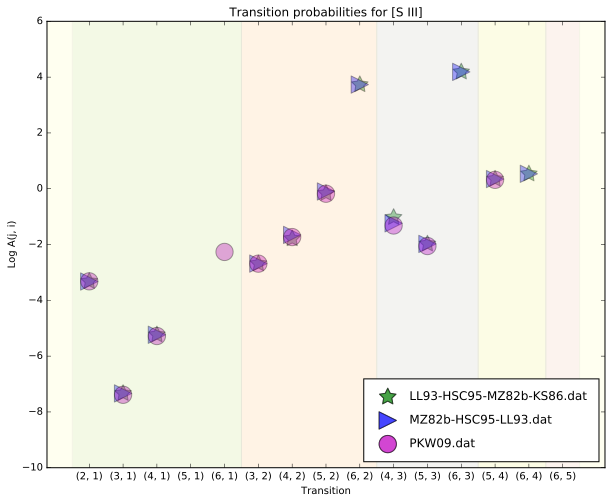

In [69]:
dp_S3.plotA(figsize=(10, 8)) # transition probabilities plot

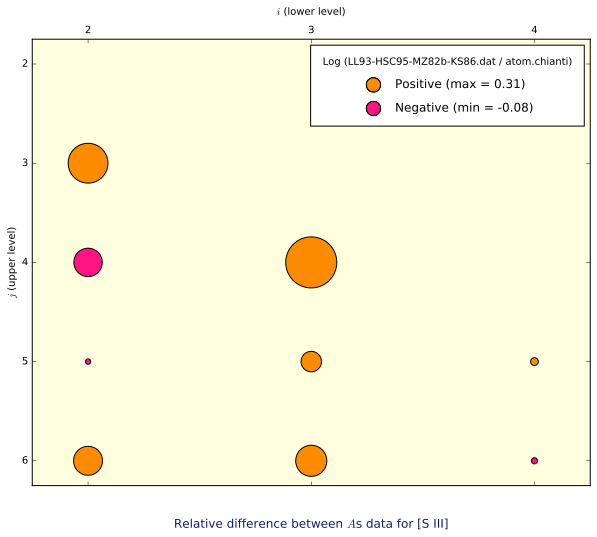

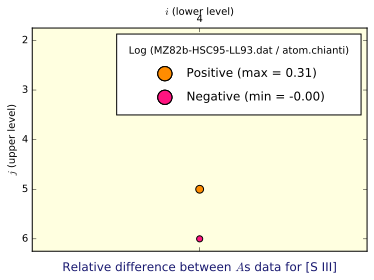

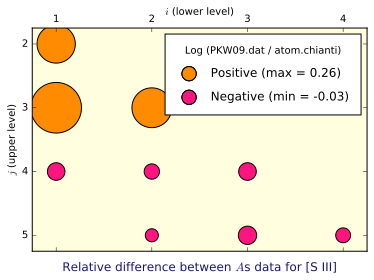

In [70]:
dp_S3.plotRelA(figsize=(10, 8)) # relative transition probabilities plot

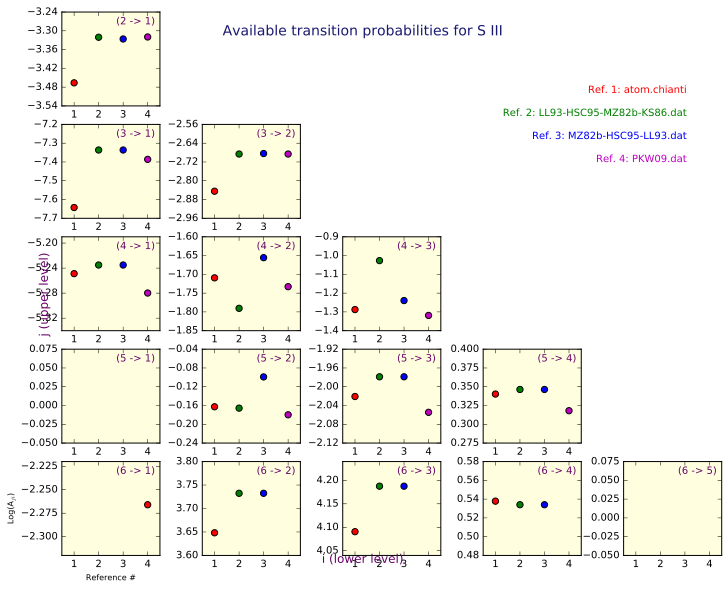

In [71]:
dp_S3.plotAllA(figsize=(10, 8)) 

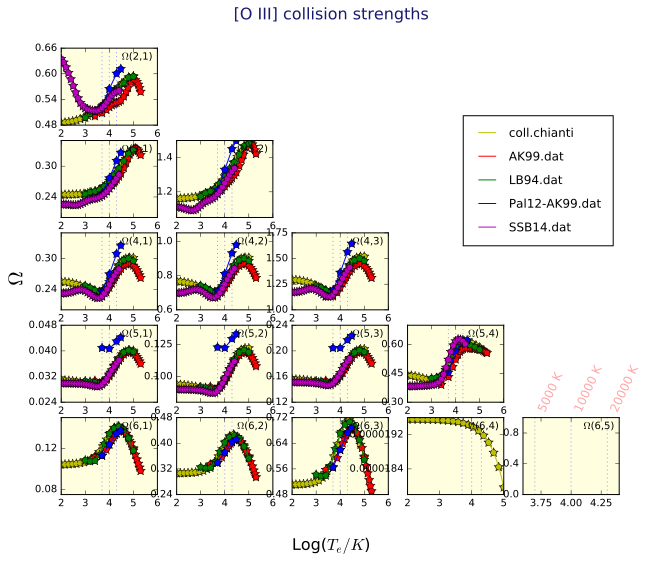

In [72]:
dp_O3.plotOmega(figsize=(10, 8)) # collision strength plot

### Recombination lines: the RecAtom class

This object is similar to __Atom__, but some methods differ due to the particularities of the recombination spectrum. It is instantiated with the following command:

In [73]:
H1 = pn.RecAtom('H', 1)

The data are read from a fits file and interpolated in temperature and density. The name of the file is retrievable through:  

In [74]:
pn.atomicData.getDataFile('H1', 'rec')

'h_i_rec_SH95.fits'

The ions for which recombination lines are available are listed with the command:

In [75]:
pn.atomicData.getAllAtoms(coll=False, rec=True)

['He1', 'He2', 'H1']

You can list all the available data files for a given ion by:

In [76]:
pn.atomicData.getAllAvailableFiles('H1')

['h_i_atom.chianti',
 'h_i_coll.chianti',
 'h_i_rec_SH95-caseA.fits',
 'h_i_rec_SH95.fits',
 'h_i_trc_SH95-caseA.dat',
 'h_i_trc_SH95-caseB.dat']

The emissivities are obtained by, e.g.:

In [77]:
Hbeta = H1.getEmissivity(tem=1e4, den=1e3, lev_i=4, lev_j=2)
Halpha = H1.getEmissivity(tem=1e4, den=1e3, lev_i=3, lev_j=2)
print Halpha/Hbeta

2.85691188359


The argument used to identify the various lines in the data file depend on whether the atom is a hydrogenoid or not. In the first case, the transition can be specified either as a pair of levels __lev_i__, __lev_j__, or as a label (labels are descriptive of level pairs):

In [78]:
print H1.getEmissivity([1e4, 1.8e4], [1e4, 1e2], lev_i = 4, lev_j = 2)

[[  1.24000000e-25   1.23500000e-25]
 [  7.40180000e-26   7.38740000e-26]]


In [79]:
print H1.getEmissivity([1e4, 1.8e4], [1e4, 1e2], label='4_2')

[[  1.24000000e-25   1.23500000e-25]
 [  7.40180000e-26   7.38740000e-26]]


As in the case of collisional lines, setting __product=False__ modifies the input array of temperature and density values:

In [80]:
print H1.getEmissivity([1e4, 1.8e4], [1e4, 1e2], label='4_2', product=False)

[  1.24000000e-25   7.38740000e-26]


In the case of non-hydrogenoids, the transition can be specified either as a wavelength or as a label (labels are descriptive of wavelengths):

In [81]:
He1 = pn.RecAtom('He', 1)
print He1.getEmissivity(1e4, 1e2, wave=4471.0)
print He1.getEmissivity(1e4, 1e2, label='4471.0')

6.11561306801e-26
6.11561306801e-26


Enter __$<$Atom.labels$>$__ to display the valid labels for both kind of recombiation atoms, i.e.:

In [82]:
H1.labels[0:10]

['2_1', '3_1', '3_2', '4_1', '4_2', '4_3', '5_1', '5_2', '5_3', '5_4']

As an example application, you can easily generate a 2D table of H alpha/ H Beta as a function of Te and Ne:

In [83]:
tem = np.linspace(5000, 20000, 100)
den = np.logspace(2, 6, 100)
im_Hab = (H1.getEmissivity(tem, den, label='3_2') / H1.getEmissivity(tem, den, label='4_2'))
print im_Hab.shape
print np.min(im_Hab)
print np.max(im_Hab)

(100, 100)
2.72452373753
3.04092769441


By default, H1 emissivities are computed under case B; to compute Case A emissivities, the atomic data file must be changed:

In [84]:
pn.atomicData.getAllAvailableFiles('H1')

['h_i_atom.chianti',
 'h_i_coll.chianti',
 'h_i_rec_SH95-caseA.fits',
 'h_i_rec_SH95.fits',
 'h_i_trc_SH95-caseA.dat',
 'h_i_trc_SH95-caseB.dat']

In [85]:
pn.atomicData.setDataFile('h_i_rec_SH95-caseA.fits')

In [86]:
H1_A = pn.RecAtom('H', 1)

In [87]:
im_caseAoverB = (H1_A.getEmissivity(tem, den, label='4_2')/H1.getEmissivity(tem, den, label='4_2'))

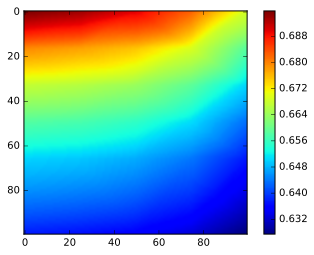

In [88]:
plt.imshow(im_caseAoverB)
plt.colorbar()

## The extinction class: RedCorr()

The class RedCorr manages the extinction (reddening) correction. It can compute the logarithmic extinction at H$\beta$ by comparing an observed ratio to a theoretical one (usually H$\alpha$/H$\beta$, but any other ratio can be used). The object is also able to compute the correction to be applied to any intensity, given the wavelength of the line.

Various extinction laws are included in the class, and any user-defined function can also be implemented. The available extinction laws can be listed by entering (here no need to instantiate an object):

In [89]:
pn.RedCorr().printLaws()

'G03 LMC': 
        Extinction curve for the LMC
        Gordon et al. (2003, ApJ, 594,279)
        http://adsabs.harvard.edu/abs/2003ApJ...594..279G
        
        Comments:
        Average curve for the LMC
        R_V = 3.41

        Scope: LMC
        Range: 1200 through fIR   

        
'K76': 
        Kaler 1976, ApJS, 31, 517
        http://adsabs.harvard.edu/abs/1976ApJS...31..517K
        
        Comments:
        This function returns the correction relative to Hbeta (f_lambda) and not
        the extinction law (X(1/lambda)).
        It cannot be used for absolute correction.
        
        Range: 3000 to >20000
        
        
'F99-like': 
        In the UV, it returns the Fitzpatrick & Massa 1990 law.
        In the opt/IR, it returns the Fitzpatrick & Massa 1990 law. 
        
        Fitzpatrick 1999, PASP, 11, 63
        http://adsabs.harvard.edu/abs/1999PASP..111...63F
        Fitzpatrick & Massa 1990, ApJS, 72, 163
        http://adsabs.harvard.edu/abs/1990ApJS

Less detailed output is obtained with:

In [90]:
pn.RedCorr().getLaws()

['G03 LMC',
 'K76',
 'F99-like',
 'F88 F99 LMC',
 'No correction',
 'SM79 Gal',
 'MCC99 FM90 LMC',
 'CCM89 Bal07',
 'CCM89 oD94',
 'S79 H83 CCM89',
 'F99',
 'CCM89']

To apply an extinction correction, you have to define a RedCorr object:

In [91]:
rc = pn.RedCorr(E_BV = 1.2, R_V = 3.2, law = 'F99')

The parameters can also be defined after the instantiation:

In [92]:
rc = pn.RedCorr() 
rc.E_BV = 1.34
rc.law = 'S79 H83 CCM89'

$c(H\beta)$ and $E_{B-V}$ are related through:
    
$$(1-f_\lambda).c(H\beta) = 0.4 E_{B-V} X_\lambda$$ applied to $\lambda$ = 4861, with $f_\beta$ = 0.:

so that, once one of the two parameters is defined, the other is also automatically defined; to output its value, enter:

In [93]:
rc.cHbeta

1.9457101047071228

The reddening of a given spectrum is determined by using the ratio of two observed line intensities relative to the theoretical value, for example:

In [94]:
rc.setCorr(6.5 / 2.86, 6563., 4861.)

Once a law and either c(H$\beta$) or E$_{B-V}$ are defined, the correction for any wavelength is obtained by:

In [95]:
wave = 5007.0
corr = rc.getCorr(wave)
print corr

11.8468982794


where __wave__ can either be a single wavelength or a list or array of wavelengths.

The correction relative to the H$\beta$ correction is given by:

In [96]:
corr = rc.getCorrHb(wave)
print corr

0.912421020017


and the correction relative to any other wavelength (p. ej., H$\alpha$) is given by:

In [97]:
corr = rc.getCorr(5007., 6563.)
print corr

2.07325069463


The class includes a plotting tool to have a quick look at the different extinction laws:

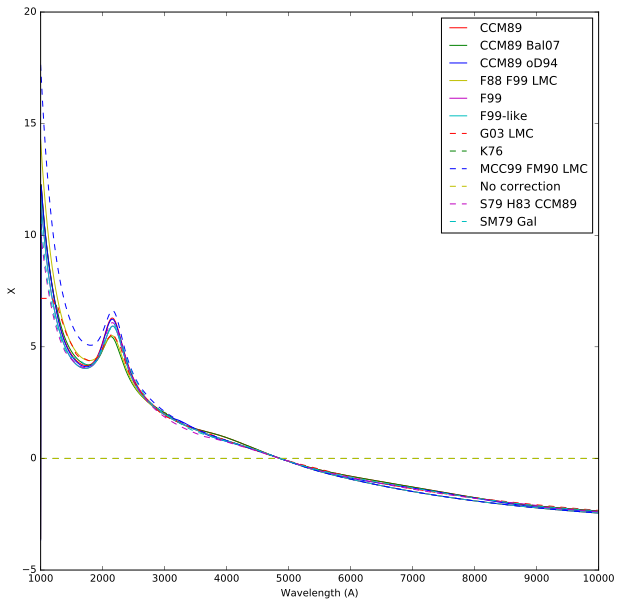

In [98]:
f, ax = plt.subplots(figsize=(10,10))
rc.plot(laws = 'all', ax=ax)

A user-defined method can also be used. User-defined methods must accept 2 parameters: the first is the wavelength (or wavelength array), in Angstrom, and the second is an optional parameter (which can also be a list). The method must return $X(\lambda) = A(\lambda)/E_{B-V} = R_V A(\lambda)/A_V$. The correction is then: $10^{0.4 E_{B-V} X(\lambda)}$

Here is an example of a user-defined function:

In [99]:
def my_X(wave, params = [5000., 1., 2., 3.]):
    return params[1] * (wave/params[0]) + params[2] * (wave/params[0])**-1 + params[3] * (wave/params[0])**-2
rc.UserFunction = my_X
rc.UserParams = [6000., 1., 5., 1.]
rc.law = 'user'
print rc.getCorr(5007)

342.093161202


## The EmissionLine class

This is the class characterizing emission lines. An emission line is identified by an element and a spectrum (which identify the emitting ion), a wavelength in Angstrom, a blend flag, a label in the standard PyNeb format, an observed intensity, a reddening-corrected intensity, an expression describing how the intensity depends on the included wavelengths, an observational error and an error on the corrected intensity. Other programs determine one or more of these values.

To instantiate an Emission Line object, use the following:

In [100]:
line = pn.EmissionLine('O', 3, 5007, obsIntens=[1.4, 1.3])
line2 = pn.EmissionLine(label = 'O3_5007A', obsIntens=320, corrected=True)

obsIntens is a value, a list or a numpy array of values corresponding to the observed intensity of the given emission line.

In [101]:
print line

Line O3 O3_5007A


To know how the label of a given line is exactly spelled, you can print the dictionary pn.LINE_LABEL_LIST

In [102]:
print pn.LINE_LABEL_LIST['O3']

['4931A', '4959A', '5007A', '2315A', '2321A', '2331A', '4363A', '1658A', '1661A', '1666A', '2497A', '5833A', '88.3m', '32.6m', '51.8m']


It is possible to instantiate a line not contained in the pn.LINE_LABEL_LIST. In this case a warning is issued, but the code doesn't stop.

The observed intensity is stored in __line.obsIntens__ and the extinction-corrected intensity is stored in __line.corrIntens__. __line.corrIntens__ is set to 0.0 when the line is instantiated, unless the parameter corrected is set to __True__, in which case the observed value __obsIntens__ is copied to the __corrIntens__ slot (the same applies for __corrError__, which is set to __obsError__). 

The __corrIntens__ value can also be computed using an instantiation of the __pn.RedCorr__ class:

In [103]:
redcorr = pn.RedCorr(E_BV = 0.87, law = 'F99')

In [104]:
line.correctIntens(redcorr) #redcorr is used to compute line.corrIntens

The line information is printed using:

In [105]:
line.printLine()

Line O3 O3_5007A evaluated as L(5007)
Observed intensity: [ 1.4  1.3]
Observed error: [ 0.  0.]
Corrected intensity: [ 22.58352855  20.97041937]
Corrected error: [ 0.  0.]


Most of the times, users will not need to define or manipulate EmissionLine objects, since most of the work on the EmissionLine objects will be performed from the Observation class (read data, extinction correction); see next section.

WARNING: Note that the wavelengths assigned to EmissionLine objects are simply the numerical part of the label:

In [106]:
Hb1 = pn.EmissionLine(label='H1r_4861A').wave
print Hb1

4861.0


whereas pn.Atom computes them as the difference from energy levels:

In [107]:
Hb2 = pn.RecAtom('H', 1).getWave(4, 2)
print Hb2

4861.33165987


This can cause small errors when both methods are used simultaneously. For instance, the extinction correction at Hb1 is slightly different from the expected value of 1: 

In [108]:
rc.getCorrHb(Hb1)

1.0004052204507501

This happens because the ExtCorr uses the precise H$\beta$ value computed from energy levels. If this roundoff error exceeds your tolerance, a possible workaround is forcing the emission line to have exactly the wavelength computed from the energy levels:

In [109]:
Hb11 = pn.EmissionLine('H', 1, wave=Hb2).wave
print rc.getCorrHb(Hb11)

warng EmissionLine: Atom H1 not valid
1.0


This will generate a warning (as the transition is not included in the inventory for the specified atom), but the code won't stop.

## The Observation class: reading and dealing with observations

### Reading observation from a file

pn.Observation is the class characterizing observation records. An observation record is composed of an object identifier, the observed intensity of one or more emission lines, and, optionally, the dereddened line intensities and the identifier of the extinction law used, and the value of c(Hbeta).

Observations can be initialized by reading data files, which can be organized with different emission lines either in rows or columns (usually, in a survey of many objects with few emission lines emission lines change across columns; and in a high-resolution observation of a small sample of objects lines change across rows).

The following is an example of how to define an observation:

In [110]:
obs = pn.Observation()

In [111]:
%%writefile observations1.dat
LINE SMC_24
S4_10.5m   7.00000
Ne2_12.8m  8.3000
Ne3_15.6m 34.10
S3_18.7m  10.
O2_3726A  39.700
O2_3729A  18.600
Ne3_3869A 18.90
Ne3_3968A  6.4
S2_4069A   0.85
S2_4076A   0.450
O3_4363A   4.36
H1r_4861A 100.00
O3_5007A 435.09
N2_5755A   0.510000
S3_6312A   0.76
O1_6300A   1.69
O1_6364A   0.54
N2_6548A   6.840000
H1r_6563A   3.45
N2_6584A  19.00
S2_6716A   1.220000
S2_6731A   2.180000
Ar3_7136A  4.91
O2_7319A+   6.540000
O2_7330A+   5.17

Overwriting observations1.dat


In [112]:
obs.readData('observations1.dat', fileFormat='lines_in_rows', err_default=0.05) # fill obs with data read from smc_24.dat

In [113]:
obs.printIntens(returnObs=True)

S4_10.5m [ 7.]
Ne2_12.8m [ 8.30000019]
Ne3_15.6m [ 34.09999847]
S3_18.7m [ 10.]
O2_3726A [ 39.70000076]
O2_3729A [ 18.60000038]
Ne3_3869A [ 18.89999962]
Ne3_3968A [ 6.4000001]
S2_4069A [ 0.85000002]
S2_4076A [ 0.44999999]
O3_4363A [ 4.36000013]
H1r_4861A [ 100.]
O3_5007A [ 435.08999634]
N2_5755A [ 0.50999999]
S3_6312A [ 0.75999999]
O1_6300A [ 1.69000006]
O1_6364A [ 0.54000002]
N2_6548A [ 6.84000015]
H1r_6563A [ 3.45000005]
N2_6584A [ 19.]
S2_6716A [ 1.22000003]
S2_6731A [ 2.18000007]
Ar3_7136A [ 4.90999985]
O2_7319A+ [ 6.53999996]
O2_7330A+ [ 5.17000008]


In [114]:
obs.extinction.law = 'CCM89'  # define the extinction law from Cardelli et al.
obs.correctData()                      # the dereddened data are computed

The data can be read by the readData method as above or directly while instantiating the object:

In [115]:
obs = pn.Observation('observations1.dat', fileFormat='lines_in_rows', corrected=True)

The format of the data file from which the emission line intensities are read can be one of three kinds: "lines_in_rows" as above, or "lines_in_cols" like this one:

In [116]:
%%writefile observations2.dat
NAME O2_3726A  O2_3726Ae O2_3729A O2_3729Ae
NGC3132 0.93000   0.05000   0.17224200 0.10  
IC418 1.28000   0.05000   0.09920000 0.05 
M33 0.03100   0.080     0.03100    0.10

Overwriting observations2.dat


In [117]:
obs2 = pn.Observation('observations2.dat', fileFormat='lines_in_cols', corrected=True)

or fileFormat='lines_in_rows_err_cols' (errors labeled “err”. Don’t name an observation “err”!) like this one:

In [118]:
%%writefile observations3.dat
LINE     TT   err  TT2 err TT3 err
cHbeta   1.2  0.0  1.5 0.2 1.1 0.2
O3_5007A 1.5  0.15 1.3  .2 1.1 0.1
H1_6563A 2.89 0.05 1.6 0.3 1.3 0.1
N2_6584A 1.   0.20 0.3 0.5 1.5 0.1

Overwriting observations3.dat


In [119]:
obs3 = pn.Observation('observations3.dat', fileFormat='lines_in_rows_err_cols', corrected=False)

warng EmissionLine: Atom H1 not valid


The delimiter between the columns is any sequence of spaces or TAB, but it can be changed using the delimiter parameter. The line names are defined by a label starting with the name of the atom (‘O2’), followed by an underscore, followed by a wavelength and ending with a unit (‘A’ or ‘m’). The list of all the lines managed by PyNeb, ordered by atoms, is obtained by entering:

In [120]:
for atom in pn.LINE_LABEL_LIST:
    print(atom, pn.LINE_LABEL_LIST[atom])

('Ba4', ['5697A'])
('Ba2', ['4935A', '6497A', '6854A', '4555A', '5854A', '6142A', '2361A', '2668A', '2726A', '4524A', '4900A', '2.05m', '1.76m', '12.5m', '5.9m'])
('S3', ['8829A', '9069A', '9531A', '3681A', '3722A', '3798A', '6312A', '33.5m', '12.0m', '18.7m'])
('Kr3', ['6827A', '9902A', '3022A', '3504A', '3600A', '5423A', '2.2m', '1.88m', '13.1m', '1.07m'])
('H1r', ['1216A', '1026A', '973A', '6563A', '4861A', '4341A', '4102A', '3970A', '3889A', '3835A', '3798A', '1.87m', '1.28m', '1.09m', '9546A', '9229A'])
('Rb4', ['5760A', '9009A', '9604A', '2603A', '3110A', '3178A', '4750A', '1.6m', '1.44m', '14.5m'])
('Ca5', ['5309A', '6087A', '6428A', '2280A', '2413A', '2464A', '3998A', '4.16m', '3.05m', '11.5m'])
('Kr5', ['5069A', '6256A', '8243A', '2550A', '2819A', '3163A', '5132A', '2.67m', '1.32m', '2.6m'])
('Ne6', ['997A', '1010A', '993A', '1006A', '986A', '999A', '559A', '563A', '1271A', '1278A', '1289A', '559A', '563A', '1270A', '1277A', '1288A', '433A', '436A', '766A', '769A', '772A', '19

The presence of a trailing “e” at the end of the label points to the error associated to the line. The error is considered to be relative to the intensity (i.e., 0.05 means 5% of the intensity), unless the parameter errIsRelative is set to False. A common value for all the errors can be defined by the parameter __err_default__ (0.10 is the default value).

### Extinction correction in Observation class

Once the data have been read, they have to be corrected from extinction. An instantiation of __RedCorr()__ is available inside the __Observation__ object as __obs.extinction__.

If the data file contains __cHbeta__ or __E(B-V)__ alongside of line labels, the corresponding information on extinction is transmitted to the extinction correction object. Otherwise, the extinction parameters must be set manually; for example:

In [121]:
obs = pn.Observation('observations1.dat', fileFormat='lines_in_rows', corrected=True)
obs.extinction.cHbeta = 1.2
obs.extinction.E_BV = 0.34

An extinction law has to be specified in either case:

In [122]:
obs.extinction.law = 'F99'

To correct all the lines at once:

In [123]:
obs.correctData()

In [124]:
obs.printIntens(returnObs=True)

S4_10.5m [ 7.]
Ne2_12.8m [ 8.30000019]
Ne3_15.6m [ 34.09999847]
S3_18.7m [ 10.]
O2_3726A [ 39.70000076]
O2_3729A [ 18.60000038]
Ne3_3869A [ 18.89999962]
Ne3_3968A [ 6.4000001]
S2_4069A [ 0.85000002]
S2_4076A [ 0.44999999]
O3_4363A [ 4.36000013]
H1r_4861A [ 100.]
O3_5007A [ 435.08999634]
N2_5755A [ 0.50999999]
S3_6312A [ 0.75999999]
O1_6300A [ 1.69000006]
O1_6364A [ 0.54000002]
N2_6548A [ 6.84000015]
H1r_6563A [ 3.45000005]
N2_6584A [ 19.]
S2_6716A [ 1.22000003]
S2_6731A [ 2.18000007]
Ar3_7136A [ 4.90999985]
O2_7319A+ [ 6.53999996]
O2_7330A+ [ 5.17000008]


In [125]:
obs.printIntens()

S4_10.5m [ 7.11975803]
Ne2_12.8m [ 8.41496764]
Ne3_15.6m [ 34.48348489]
S3_18.7m [ 10.09307839]
O2_3726A [ 171.24206763]
O2_3729A [ 80.15612017]
Ne3_3869A [ 78.13399959]
Ne3_3968A [ 25.71732799]
S2_4069A [ 3.32014218]
S2_4076A [ 1.75430783]
O3_4363A [ 15.7036518]
H1r_4861A [ 310.25435475]
O3_5007A [ 1289.85131043]
N2_5755A [ 1.24390974]
S3_6312A [ 1.66198348]
O1_6300A [ 3.70383903]
O1_6364A [ 1.16980719]
N2_6548A [ 14.34619111]
H1r_6563A [ 7.21747442]
N2_6584A [ 39.60657366]
S2_6716A [ 2.48780908]
S2_6731A [ 4.43455095]
Ar3_7136A [ 9.38391466]
O2_7319A+ [ 12.17965989]
O2_7330A+ [ 9.61370718]


If you want the corrected line intensities to be normalized to a given wavelength, use the following:

In [126]:
obs.correctData(normWave=4861.)

The extinction correction can be determined by comparing the observed values to a theoretical ratio, as in the following:

In [127]:
obs.printIntens()

S4_10.5m [ 2.29481325]
Ne2_12.8m [ 2.71228027]
Ne3_15.6m [ 11.11458529]
S3_18.7m [ 3.25316252]
O2_3726A [ 55.19408995]
O2_3729A [ 25.83561486]
Ne3_3869A [ 25.18385266]
Ne3_3968A [ 8.28911105]
S2_4069A [ 1.07013556]
S2_4076A [ 0.56544181]
O3_4363A [ 5.06154114]
H1r_4861A [ 100.]
O3_5007A [ 415.73995358]
N2_5755A [ 0.40093224]
S3_6312A [ 0.53568417]
O1_6300A [ 1.19380727]
O1_6364A [ 0.37704779]
N2_6548A [ 4.62400959]
H1r_6563A [ 2.32630882]
N2_6584A [ 12.76583972]
S2_6716A [ 0.80186113]
S2_6731A [ 1.42932755]
Ar3_7136A [ 3.02458757]
O2_7319A+ [ 3.92570151]
O2_7330A+ [ 3.09865342]


In [128]:
obs.def_EBV(label1="H1r_6563A", label2="H1r_4861A", r_theo=2.85)
print(obs.extinction.E_BV)
obs.correctData(normWave=4861.)

[-3.80825098]


In [129]:
obs.printIntens()

S4_10.5m [ 1862873.3321508]
Ne2_12.8m [ 2289624.63614709]
Ne3_15.6m [ 9681842.82513927]
S3_18.7m [ 2900918.21157661]
O2_3726A [ 0.99069915]
O2_3729A [ 0.46892362]
Ne3_3869A [ 0.75888083]
Ne3_3968A [ 0.35320246]
S2_4069A [ 0.06443513]
S2_4076A [ 0.03486379]
O3_4363A [ 0.81982369]
H1r_4861A [ 100.]
O3_5007A [ 724.22886843]
N2_5755A [ 7.55158652]
S3_6312A [ 38.21722558]
O1_6300A [ 82.92131172]
O1_6364A [ 30.17724087]
N2_6548A [ 549.03539807]
H1r_6563A [ 285.]
N2_6584A [ 1633.68483422]
S2_6716A [ 134.21899293]
S2_6731A [ 246.50683125]
Ar3_7136A [ 1116.57610378]
O2_7319A+ [ 1987.64418295]
O2_7330A+ [ 1598.12655872]


By default, this method prints out the corrected intensities. To print the observed intensities, use the __returnObs=True__ parameter.

The method __getSortedLines__ returns the lines sorted in alphabetical order according to either the emitting atoms (default) or the wavelength (using the __crit='wave'__ parameter):

In [130]:
for line in obs.getSortedLines(): 
    print(line.label, line.corrIntens[0])

('Ar3_7136A', 1116.5761037772124)
('H1r_4861A', 100.0)
('H1r_6563A', 285.0000000000004)
('N2_5755A', 7.5515865166910849)
('N2_6548A', 549.03539806966057)
('N2_6584A', 1633.6848342208623)
('Ne2_12.8m', 2289624.6361470865)
('Ne3_15.6m', 9681842.8251392711)
('Ne3_3869A', 0.75888082682114033)
('Ne3_3968A', 0.35320245770990177)
('O1_6300A', 82.921311721997114)
('O1_6364A', 30.177240871552701)
('O2_3726A', 0.99069914508263235)
('O2_3729A', 0.46892361850581255)
('O2_7319A+', 1987.6441829484479)
('O2_7330A+', 1598.1265587226821)
('O3_4363A', 0.81982369301604263)
('O3_5007A', 724.22886842764478)
('S2_4069A', 0.064435128013150128)
('S2_4076A', 0.034863794604422474)
('S2_6716A', 134.21899293495827)
('S2_6731A', 246.50683125182974)
('S3_18.7m', 2900918.2115766057)
('S3_6312A', 38.217225581304128)
('S4_10.5m', 1862873.3321507953)


The following method, which gives the list of all the atoms implied in the observed emission lines, will be useful later:

In [131]:
atomList = obs.getUniqueAtoms()

In [132]:
atomList

array(['Ar3', 'H1r', 'N2', 'Ne2', 'Ne3', 'O1', 'O2', 'O3', 'S2', 'S3', 'S4'], 
      dtype='|S3')

### Adding observations and lines

Once an __Observation__ object is instantiated, you can add a new observation (corresponding, e.g., to a new object or a new fiber) by using:

In [133]:
obs.addObs('test', np.random.rand(25))

where ‘test’ is the name of the new observation. The new observation must have the same size of __obs__, that is, it must contain __obs.n_lines__ lines.

In [134]:
obs.printIntens()

S4_10.5m [  1.86287333e+06   9.89878231e-01]
Ne2_12.8m [  2.28962464e+06   9.01003799e-01]
Ne3_15.6m [  9.68184283e+06   1.76795879e-02]
S3_18.7m [  2.90091821e+06   9.09521814e-01]
O2_3726A [ 0.99069915  0.69847094]
O2_3729A [ 0.46892362  0.51271245]
Ne3_3869A [ 0.75888083  0.27264817]
Ne3_3968A [ 0.35320246  0.29546079]
S2_4069A [ 0.06443513  0.86307066]
S2_4076A [ 0.03486379  0.43933782]
O3_4363A [ 0.81982369  0.91910674]
H1r_4861A [ 100.            0.60394002]
O3_5007A [  7.24228868e+02   6.44575237e-01]
N2_5755A [ 7.55158652  0.96374025]
S3_6312A [ 38.21722558   0.51069208]
O1_6300A [ 82.92131172   0.23916481]
O1_6364A [ 30.17724087   0.1205119 ]
N2_6548A [ 549.03539807    0.92044244]
H1r_6563A [ 285.            0.57723395]
N2_6584A [  1.63368483e+03   3.71812495e-01]
S2_6716A [ 134.21899293    0.50811338]
S2_6731A [ 246.50683125    0.3771552 ]
Ar3_7136A [  1.11657610e+03   2.12588939e-01]
O2_7319A+ [  1.98764418e+03   7.96377244e-01]
O2_7330A+ [  1.59812656e+03   8.72629934e-01]


You can also add a new emission line by means of:

In [135]:
line = pn.EmissionLine(label='Cl3_5518A', obsIntens=[3.5, 2.5])
obs.addLine(line)

In [136]:
obs.printIntens()

S4_10.5m [  1.86287333e+06   9.89878231e-01]
Ne2_12.8m [  2.28962464e+06   9.01003799e-01]
Ne3_15.6m [  9.68184283e+06   1.76795879e-02]
S3_18.7m [  2.90091821e+06   9.09521814e-01]
O2_3726A [ 0.99069915  0.69847094]
O2_3729A [ 0.46892362  0.51271245]
Ne3_3869A [ 0.75888083  0.27264817]
Ne3_3968A [ 0.35320246  0.29546079]
S2_4069A [ 0.06443513  0.86307066]
S2_4076A [ 0.03486379  0.43933782]
O3_4363A [ 0.81982369  0.91910674]
H1r_4861A [ 100.            0.60394002]
O3_5007A [  7.24228868e+02   6.44575237e-01]
N2_5755A [ 7.55158652  0.96374025]
S3_6312A [ 38.21722558   0.51069208]
O1_6300A [ 82.92131172   0.23916481]
O1_6364A [ 30.17724087   0.1205119 ]
N2_6548A [ 549.03539807    0.92044244]
H1r_6563A [ 285.            0.57723395]
N2_6584A [  1.63368483e+03   3.71812495e-01]
S2_6716A [ 134.21899293    0.50811338]
S2_6731A [ 246.50683125    0.3771552 ]
Ar3_7136A [  1.11657610e+03   2.12588939e-01]
O2_7319A+ [  1.98764418e+03   7.96377244e-01]
O2_7330A+ [  1.59812656e+03   8.72629934e-01]


### Getting line intensities

You can extract the line intensities from an __Observation__ object by, for example:

In [137]:
obs.names

['SMC_24', 'test']

In [138]:
obs.getIntens(obsName='SMC_24')

{'Ar3_7136A': 1116.5761037772124,
 'Cl3_5518A': 8.8584535640522582e-05,
 'H1r_4861A': 100.0,
 'H1r_6563A': 285.0000000000004,
 'N2_5755A': 7.5515865166910849,
 'N2_6548A': 549.03539806966057,
 'N2_6584A': 1633.6848342208623,
 'Ne2_12.8m': 2289624.6361470865,
 'Ne3_15.6m': 9681842.8251392711,
 'Ne3_3869A': 0.75888082682114033,
 'Ne3_3968A': 0.35320245770990177,
 'O1_6300A': 82.921311721997114,
 'O1_6364A': 30.177240871552701,
 'O2_3726A': 0.99069914508263235,
 'O2_3729A': 0.46892361850581255,
 'O2_7319A+': 1987.6441829484479,
 'O2_7330A+': 1598.1265587226821,
 'O3_4363A': 0.81982369301604263,
 'O3_5007A': 724.22886842764478,
 'S2_4069A': 0.064435128013150128,
 'S2_4076A': 0.034863794604422474,
 'S2_6716A': 134.21899293495827,
 'S2_6731A': 246.50683125182974,
 'S3_18.7m': 2900918.2115766057,
 'S3_6312A': 38.217225581304128,
 'S4_10.5m': 1862873.3321507953}

In [139]:
obs.getIntens()['O2_7330A+']

array([  1.59812656e+03,   8.72629934e-01])

## Using Observation to determine ionic abundances

Once the electron temperature and density are determined, it is easy to obtain the ionic abundances from a set of emission lines included in an __Observation__ object:

In [140]:
obs = pn.Observation()
obs.readData('observations1.dat', fileFormat='lines_in_rows', err_default=0.05) # fill obs with data read from observations1.dat
obs.def_EBV(label1="H1r_6563A", label2="H1r_4861A", r_theo=2.85)
obs.correctData(normWave=4861.)
Te = [10000.]
Ne = [1e3]
# Define a dictionary to hold all the Atom objects needed
all_atoms = pn.getAtomDict(atom_list=obs.getUniqueAtoms())
# define a dictionary to store the abundances
ab_dict = {}
# we  use the following lines to determine the ionic abundances
ab_labels = ['N2_6584A', 'O2_3726A', 'O3_5007A', 'S2_6716A', 
             'S3_6312A', 'Ar3_7136A', 'Ne3_3869A']
for line in obs.getSortedLines():
    if line.label in ab_labels:
        ab = all_atoms[line.atom].getIonAbundance(line.corrIntens, Te, Ne, 
                                                  to_eval=line.to_eval, Hbeta=100)
        ab_dict[line.atom] = ab

warng _ManageAtomicData: atom data not available for H1
warng _ManageAtomicData: coll data not available for H1


In [141]:
ab_dict

{'Ar3': array([  2.96001201e-07]),
 'N2': array([  2.60645127e-06]),
 'Ne3': array([  1.37179504e-05]),
 'O2': array([  1.89336290e-05]),
 'O3': array([ 0.00010394]),
 'S2': array([  5.48539044e-08]),
 'S3': array([  1.12822738e-06])}

## Exploring line intensities with the EmisGrid class

### The EmisGrid class

Most plots are obtained by operating on emission maps, which are grids of emissivities as a function of temperature and density generated by the __EmisGrid__ class.

__EmisGrid__ instantiates an atom and computes the emissivities of all its lines for the (tem, den) values of a regularly spaced grid (may be log or linear in the case of the density). Each line is represented in a 2D array (a grid), and there are as many arrays transitions in the atom. The results can be operated on, saved for a later use in a cPickle file, or restored.

The following command instantiates an [O III] atom and computes the emissivity of all its lines in a 30x30 grid:

In [142]:
O3_EG = pn.EmisGrid('O', 3, n_tem=30, n_den=30)

The arguments are described in more details in the Reference Manual. Here is the list:

In [143]:
O3_EG = pn.EmisGrid(elem='O', spec=3, n_tem=100, n_den=100, 
                    tem_min=5000., tem_max=20000., den_min=10., 
                    den_max=1.e8, restore_file=None, atomObj=None)

The emissivity grid of a specific line can be obtained by means of:

In [144]:
O3_5007 = O3_EG.getGrid(wave=5007)

In [145]:
O3_5007.shape

(100, 100)

The emissivity grid of a combination of lines can also be computed:

In [146]:
O3_Te = O3_EG.getGrid(to_eval = 'L(4363)/L(5007)')

There are two plotting tools integrated in the __EmisGrid__ object: 

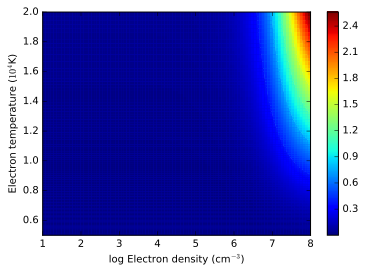

In [147]:
O3_EG.plotImage(to_eval = 'L(4363)/L(5007)')

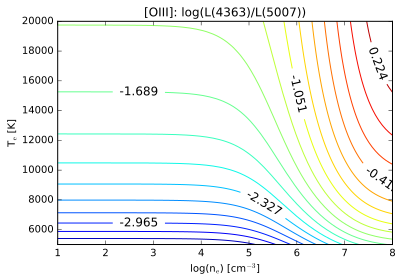

In [148]:
O3_EG.plotContours(to_eval = 'L(4363)/L(5007)')

See the Reference Manual for more option and the __Diagnostic__ class for producing plots combining different atoms.

### Instantiating various EmisGrid objects with getEmisGridDict

It is quite common to have to instantiate various __EmisGrid__ objects, especially if you want to make a diagnostic diagram. This can easily be done using the __getEmisGridDict__ method, used for example as follows:

In [149]:
emisgrids = pn.getEmisGridDict(atom_list=['O2', 'O3', 'N2'])

In [150]:
emisgrids

{'N2': <pyneb.core.emisGrid.EmisGrid at 0x7fd8a059ec90>,
 'O2': <pyneb.core.emisGrid.EmisGrid at 0x7fd89b90a3d0>,
 'O3': <pyneb.core.emisGrid.EmisGrid at 0x7fd89b90a6d0>}

This command generates a dictionary of emission grids for [O II], [O III] and [N II]. The resulting maps are saved in a directory defined by default when PyNeb is started, in the pn.config.pypic_path variable. It first tries to use the $HOME/.pypics directory; if it fails, it tries to use /tmp/pypic; if it fails too, the value is set to None and a user-defined value has to be provided by changing pn.config.pypic_path  or using the pypic_path parameter when calling getEmisGridDict.

If a Diagnostic object is already available (see next Section), it can be used to determine the relevant atoms for which a grid must be computed or restored:

In [151]:
diags = pn.Diagnostics() # See next section
emisgrids = pn.getEmisGridDict(atomDict=diags.atomDict, den_max=1e6)

This __EmisGrid__ dictionary will be very useful to plot diagnostic diagrams with the __Diagnostic__ object, as is described in the next section.

## The Diagnostics class

__Diagnostics__ is the class used to evaluate temperatures and densities from line ratios. It is also the class that plots the diagnostic Te-Ne diagrams. The object is instantiated like this:

In [152]:
diags = pn.Diagnostics()        # instantiate the Diagnostic class  

An optional parameter __addAll=True__ (default is __False__) lets the object load all the available diagnostics. Most of the time this option is not used and the diagnostics are added manually as they are needed:

In [153]:
diags.addDiag(['[NI] 5198/5200','[NII] 5755/6548','[OII] 3726/3729'])

Each diagnostic is defined by a label and is associated to a tuple containing 3 elements: the atom corresponding to the diagnostic lines, the algebraic definition of the line ratios and the algebraic definition of the error of the diagnostic, which depends on the error of each line involved. In the present case, the diagnostic is the ratios of two [O III] lines, 4363/5007, and the error is the quadratic sum of the relative error of each line (E(lambda)): RMS(a, b) = sqrt(a**2 + b**2).

Users can also define their own diagnostics, for example using:

In [154]:
diags.addDiag('[OIII] 4363/4959', ('O3', 'L(4363)/L(4959)', 'RMS([E(4363),E(4959)])'))

Notice that the diagnostics are defined so that they tend to increase with the main parameter they trace: [OIII] 4363/5007 increases with the electron temperature.

The diagnostics contained in a __Diagnostics__ object are listed by means of the __diags.getDiagLabels()__ and __diags.getDiags()__ methods. Once added to the __Diagnostics__ object, they can be used either to compute __Te__ and __Ne__ via __getCrossTemDen__ or to plot diagrams (see below). A diagnostic can be removed from the list with the __delDiag__ method.

### Determination of temperature and density

The __getCrossTemDen__ method cross-converges the temperature and density derived from two sensitive line ratios (not necessarily from the same atom), by inputting the quantity derived with one line ratio into the other and then iterating. When the iteration process ends, the two diagnostics give self-consistent results. The first line ratio must be a temperature-sensitive one and the second a density-sensitive one. The temperature and density can be individual numbers as well as arrays (provided they are equal in shape).

In [155]:
diags.getCrossTemDen('[NII] 5755/6548', '[SII] 6731/6716', 0.02, 1.0)

(7622.597437360454, 444.7122084104995)

In [156]:
for diag in sorted(pn.diags_dict.keys()):
    print('"{0}" : {1}'.format(diag, pn.diags_dict[diag]))

"[ArIII] (7751+7136)/9m" : ('Ar3', '(L(7751)+L(7136))/L(90000)', 'RMS([E(90000), E(7751)*L(7751)/(L(7751)+L(7136)), E(7136)*L(7136)/(L(7751)+L(7136))])')
"[ArIII] 5192/7136" : ('Ar3', 'L(5192)/L(7136)', 'RMS([E(7136), E(5192)])')
"[ArIII] 5192/7300+" : ('Ar3', 'L(5192)/(L(7751)+L(7136))', 'RMS([E(7751)*L(7751)/(L(7751)+L(7136)), E(7136)*L(7136)/(L(7751)+L(7136)), E(5192)])')
"[ArIII] 7136/9m" : ('Ar3', 'L(7136)/L(90000)', 'RMS([E(90000), E(7136)])')
"[ArIII] 9.0m/21.8m" : ('Ar3', 'L(89897)/L(218000)', 'RMS([E(89897), E(218000)])')
"[ArIV] 2860+/4720+" : ('Ar4', '(L(2854)+L(2868))/(L(4711)+L(4740))', 'RMS([E(4711)*L(4711)/(L(4711)+L(4740)), E(4740)*L(4740)/(L(4711)+L(4740)), E(2854)*L(2854)/(L(2854)+L(2868)), E(2868)*L(2854)/(L(2854)+L(2868))])')
"[ArIV] 4740/4711" : ('Ar4', 'L(4740)/L(4711)', 'RMS([E(4711), E(4740)])')
"[ArIV] 7230+/4720+" : ('Ar4', '(L(7170)+L(7263))/(L(4711)+L(4740))', 'RMS([E(4711)*L(4711)/(L(4711)+L(4740)), E(4740)*L(4740)/(L(4711)+L(4740)), E(7170)*L(7170)/(L(7170

### Diagnostic diagram combining various atoms

The plotting tool included in the __Diagnostics__ class requires an __EmisGrid__ dictionary (as returned by __pn.getEmisGridDict__; see the previous section) and an __Observation__ object. The plot is obtained by:

In [157]:
diags = pn.Diagnostics()
diags.addDiagsFromObs(obs)
print(diags.diags)

{'[NeIII] 3869/15.6m': ('Ne3', 'L(3869)/L(156000)', 'RMS([E(156000), E(3869)])'), '[NII] 5755/6584': ('N2', 'L(5755)/L(6584)', 'RMS([E(6584), E(5755)])'), '[NeIII] 3930+/15.6m': ('Ne3', '(L(3869)+L(3968))/L(156000)', 'RMS([E(156000), E(3869)*L(3869)/(L(3869)+L(3968)), E(3968)*L(3968)/(L(3869)+L(3968))])'), '[OIII] 4363/5007': ('O3', 'L(4363)/L(5007)', 'RMS([E(5007), E(4363)])'), '[SIII] 6312/18.7m': ('S3', 'L(6312)/L(187000)', 'RMS([E(187000), E(6312)])'), '[SII] 4069/4076': ('S2', 'L(4069)/L(4076)', 'RMS([E(4069), E(4076)])'), '[SII] 4072+/6720+': ('S2', '(L(4069)+L(4076))/(L(6716)+L(6731))', 'RMS([E(6716)*L(6716)/(L(6716)+L(6731)), E(6731)*L(6731)/(L(6716)+L(6731)), E(4069)*L(4069)/(L(4069)+L(4076)), E(4076)*L(4076)/(L(4069)+L(4076))])'), '[OII] 3727+/7325+': ('O2', '(L(3726)+L(3729))/(B("7319A+")+B("7330A+"))', 'RMS([E(3726)*L(3726)/(L(3726)+L(3729)), E(3729)*L(3729)/(L(3726)+L(3729)),BE("7319A+")*B("7319A+")/(B("7319A+")+B("7330A+")),BE("7330A+")*B("7330A+")/(B("7319A+")+B("7330A+"

ValueError: zero-size array to reduction operation minimum which has no identity

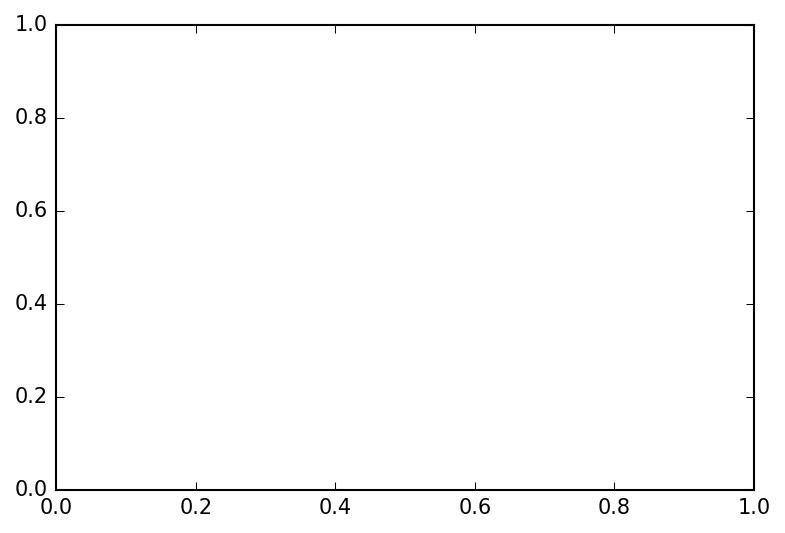

In [158]:
%config InlineBackend.figure_format = 'png'
mpl.rc("savefig", dpi=150)
emisgrids = pn.getEmisGridDict(atomDict=diags.atomDict)
diags.plot(emisgrids, obs)

If there is more than one spectrum in the __Observation__ object, the index of the observation to be used is given by __i_obs__:

In [ ]:
diags.plot(emisgrids, obs, i_obs = 0)

In [ ]:
diags.diags

The label used to identify emission lines can be changed in the __diags__ object, using for example:

In [ ]:
diags.addClabel('[OIII] 4363/5007', '[OIII]na')

## Determination of elemental abundances using ICFs

The determination of elemental abundances is complicated by the fact that some ions are not observed. To take this into account when computing the total abundances, it is necessary to use ionization correction factors (ICFs). ICFs are expressions used to correct the abundance of observed ions for unseen ions to get the total elemental abundance of a given element:
$$X(elem) = X(ion) * icf,$$
where $X(ion)$ may be the abundance of one single ion or the sum of several ions of the element. These expressions are generally obtained empirically or semiempirically, based on the results of photoionization models or a comparison between the ionization potentials of different ions. Most expressions have been devised for a specific kind of object (e.g., PNe, HII regions, etc) and should not be applied to objects of a different kind.

In PyNeb, an icf formula is identified by an element ("elem", e.g. "O"), which is the element of which the total abundance is seeked for;  the ion or ions whose abundance is corrected ("atom", e.g.  "O2+O3"); and the icf proper, which is an expression involving the abundances of other ions, assumed to be known ("icf", e.g. "1 + 0.5 * He3 / (He2 + He3)"). In addition, each icf expressions is identified by a label and holds the original reference and a brief comment specifying its intended field of application. The label is formed by an acronym of the paper and the equation  number of the icf within the paper.

The following snippet illustrates how PyNeb manages icfs:

In [ ]:
atom_abun = {'O2': 0.001, 'O3': 0.002, 'Ne3': 1.2e-5}
icf = pn.ICF()
print icf.getAvailableICFs('Ne')   # lists all the available recipes for Ne

In [ ]:
elem_abun = icf.getElemAbundance(atom_abun, icf_list=['TPP77_15']) # Computes the Ne abundance with the TPP06 recipe
print elem_abun

In [ ]:
elem_abun = icf.getElemAbundance(elem_abun)  # performs all the possible element abundance computations given the input ionic abundance set and available icf  
print elem_abun

The first line above defines a set of ionic abundances; the second defines an ICF object; the third lists the label of all the available recipes for Ne; in the fourth, a specific one is selected to compute the desired abundance; in the fifth line, all the possible element abundance computations given the present icf set are performed (these may include icfs not suitable for the object under study).

Additionally, PyNeb provides a series of single-line commands to explore the icf collection and its source papers; e.g.:

In [ ]:
print icf.getAvailableICFs()

In [ ]:
print icf.getExpression('KH01_4g')   # returns the analytical expression of the icf identified by the label KH01_4g

In [ ]:
print icf.getReference('KH01_4g')   # returns the bibliographic reference of the source paper

In [ ]:
print icf.getURL('KH01_4g')   # returns the ADS URL of the source paper

PyNeb provides a large set of icfs compiled from the literature; each icf is stored together with the bibliographic reference, the URL and a comment with further details. Further expressions are being added continuously, and a special function (__addICF__) enables users to add customized expressions to the collection.

## The logging facility

When importing PyNeb, a special object named __pn.log__ is instantiated to hold messages (error, warnings, normal messages and debug tools). This object receives messages, writes them to the standard output (and eventually to a file) and also holds them in memory. It can also stop the execution and raise an error when error message is sent to it. It also keeps track of which method in the code is sending the message (the named __calling__ parameter), and the time at which is was sent.

There is a level of verbosity, which can be changed at any moment (e.g. __pn.log_.level = 2__), which determines the kind of messages that will be printed to the standard output (commonly the screen).

__pn.log__ can manage 5 types of messages:

* __debug__: using __pn.log_.debug('This is the message', calling = 'Routine1')__; it is printed if pn.log\_level >= 4.
* __message__: using __pn.log_.message('This is the message', calling = 'Routine1')__; it is printed if pn.log\_level >= 3.
* __warning__: using __pn.log_warn('This is the warning', calling = 'Routine1')__; it is printed if pn.log\_level >= 2.
* __error__: using __pn.log_error('This is the error', calling = 'Routine1')__; it is printed if pn.log\_level >= 1. When error is called, an error is raised using exception PyNebError, unless the exception argument is given. This default behavior is altered by changing pn.log\_.no\_exit to False, in which case a SystemExit exception is raised (and the program stops).
* __timer__: using __pn.log_.timer('Ending the process', calling = 'Routine1', quiet = False)__. This method prints (if quiet = True) the message with the time spent since the last call of timer.

At any moment in a script file, the verbosity can be changed either to see what's happening, or to avoid being annoyed by too many messages.

# Sample scripts

## Simple diagnostic diagram

In [ ]:
%%writefile smc24.dat
NAME SMC_24
cHbeta     0.047
S4_10.5m   7.00000
Ne2_12.8m  8.3000
Ne3_15.6m 34.10
S3_18.7m  10.
O2_3726A  39.700
O2_3729A  18.600
Ne3_3869A 18.90
Ne3_3968A  6.4
S2_4069A   0.85
S2_4076A   0.450
O3_4363A   4.36
O3_5007A 435.09
N2_5755A   0.510000
S3_6312A   0.76
O1_6300A   1.69
O1_6364A   0.54
N2_6548A   6.840000
N2_6584A  19.00
S2_6716A   1.220000
S2_6731A   2.180000
Ar3_7136A  4.91
O2_7319A+   6.540000
O2_7330A+   5.17
S3_33.6m    8.

In [ ]:
# Diagnostic plot

# Imports
%matplotlib inline
%config InlineBackend.figure_format = 'png'
import pyneb as pn
import matplotlib.pyplot as plt

### General settings
# Setting verbosity level. Enter pn.my_logging? for details
pn.log_.level = 2 # set this to 3 to have more details

# Adopt an extinction law
extinction_law = 'CCM89'

# Define the data file
obs_data = 'smc24.dat'

# Define plot title
title = 'SMC 24'

### Read and deredden observational data
# define an Observation object and assign it to name 'obs'
obs = pn.Observation()

# fill obs with data read from file obs_data, with lines varying across rows and a default percent error on line intensities
obs.readData(obs_data, fileFormat='lines_in_rows', err_default=0.05)

# deredden data with Cardelli's law
obs.extinction.law = extinction_law
obs.correctData()

### Include the diagnostics of interest
# instantiate the Diagnostics class
diags = pn.Diagnostics()
# include in diags the relevant line ratios
diags.addDiag([
              '[NII] 5755/6584', 
              '[OII] 3726/3729', 
              '[OIII] 4363/5007', 
              '[SII] 6731/6716', 
              '[SII] 4072+/6720+',
              '[SIII] 6312/18.7m', 
              '[NeIII] 3930+/15.6m', 
              ])
diags.addClabel('[SII] 6731/6716', '[SII]a')
diags.addClabel('[SII] 4072+/6720+', '[SII]b')

# Create the emission maps to be compared to the observation data (some overkill here)
emisgrids = pn.getEmisGridDict(atom_list=diags.getUniqueAtoms(), den_max=1e6)

### Plot
# Create the contour plot as the intersection of tem-den emission maps with dereddened line ratios
diags.plot(emisgrids, obs)

# Place the title
plt.title(title)

# Display the plot
plt.show()

#The observed ratio can be automatically extracted from an Observation object named obs:
Te, Ne = diags.getCrossTemDen('[NII] 5755/6548', '[SII] 6731/6716', obs=obs)
print Te, Ne

## Extinction

In [ ]:
# Sample extinction in PyNeb
# shows how to display available extinction laws, select one or define a new one,
# and do some simple dereddening calculations
# Further examples can be found in other sample scripts
%config InlineBackend.figure_format = 'svg'
import numpy as np
import matplotlib.pyplot as plt
import pyneb as pn

# Convert wavelength to x
def x(wave):
    return 10000. / wave

# Define an extinction law (to be used below)
def my_X(wave, par=0):
    x = 10000. / wave
    Rv = 3.1
    X_lin = x/2. # linear part of the extinction law
    X_bump = 0.5*x**2. -6*x + 20. # bump part of the extinction law
    return Rv*np.where(x<5., X_lin, X_bump)

# Define a reddening correction object
RC = pn.RedCorr()

# List the available laws
#RC.printLaws()

# Plot the available laws
plt.figure(figsize=(10,10))
RC.plot(laws='all')
plt.show()

# Choose the one we intend to use 
RC.law = 'CCM89'
# or define a new one
RC.UserFunction = my_X
RC.law = 'user'

# Plot the selected law as a function of x
# Define an array in lambda to do the plot
wave= np.logspace(2.5, 5, 100)
# Plot commands
fig = plt.figure()
ax = fig.add_subplot(111)
ax.set_ylim([0, 15])
ax.set_xlim([0, 10])
ax.plot(x(wave), my_X(wave), label='%s' % (RC.law))
plt.xlabel('1/$\lambda$ ($\mu^{-1}$)')
plt.ylabel('A$_V$/E(B-V)')
plt.legend(loc='upper left')
plt.show()

# Correct observed line ratios
wave1 = 5007
I_obs1 = 4.0
wave2 = 4686
I_obs2 = 0.10

# Correct based on the given law and the observed Ha/Hb ratio
RC = pn.RedCorr(law='CCM89')
I_obs_HaHb = 3.5 
I_theo_HaHb = 2.86 
RC.setCorr(I_obs_HaHb / I_theo_HaHb, 6563., 4861.)
print 'Correction based on the given law and the observed Ha/Hb ratio:'
print str(wave1) + ': I_obs =', I_obs1, ' I_dered =', I_obs1 * RC.getCorrHb(wave1)
print str(wave2) + ': I_obs =', I_obs2, ' I_dered =', I_obs2 * RC.getCorrHb(wave2)

# Correct based on the given law and c(Hb)
RC = pn.RedCorr(law='CCM89', cHbeta=0.3)
print '\nCorrection based on the given law and c(Hbeta):'
print str(wave1) + ': I_obs =', I_obs1, ' I_dered =', I_obs1 * RC.getCorrHb(wave1)
print str(wave2) + ': I_obs =', I_obs2, ' I_dered =', I_obs2 * RC.getCorrHb(wave2)


## Line ratio and diagnostics

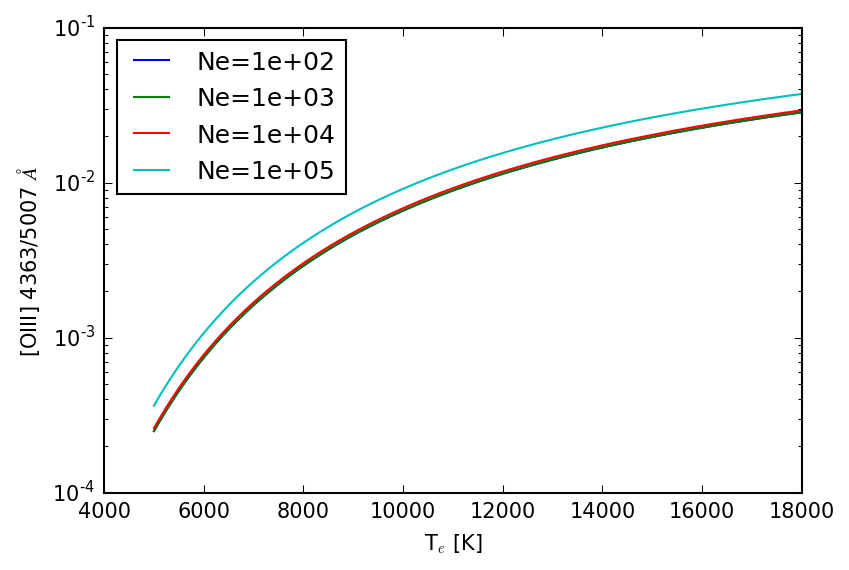

In [159]:
"""
Sample PyNeb script
Plots the [O III] 4363/5007 ratio as a function of Te for several Ne values
"""

# Import relevant packages
import numpy as np
import matplotlib.pyplot as plt
import pyneb as pn

# Set high verbosity level to keep track of atom creation
pn.log_.level = 2 # Set to 3 if you want all the atoms to be printed out

# Create a collection of atoms - a bit overkill if we just need O III
adict = pn.getAtomDict()

# Lower verbosity level
pn.log_.level = 2

# Function to compute line ratio
def line_ratio(atom, wave1, wave2, tem, den):
    emis1 = adict[atom].getEmissivity(tem, den, wave = wave1)
    emis2 = adict[atom].getEmissivity(tem, den, wave = wave2)
    return emis1 / emis2

# Define array of Te 
tem = np.arange(5000, 18000, 30)

# Plot
plt.figure(1)
for den in [1e2, 1e3, 1e4, 1e5]:
    plt.semilogy(tem, line_ratio('O3', 4363, 5007, tem, den), label = 'Ne={0:.0e}'.format(den))
plt.xlabel('T$_e$ [K]')
plt.ylabel(r'[OIII] 4363/5007 $\AA$')
plt.legend(loc=2)

plt.show()

## Contour plots

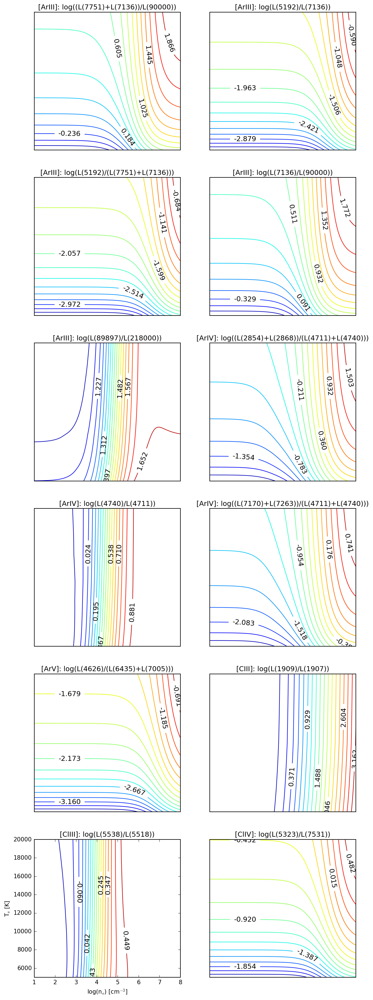

In [160]:
# Plot the contour diagram of the selected diagnostics
# Warning: it takes a long time to plot the 80 contours
import matplotlib.pyplot as plt
import pyneb as pn
from pyneb.core.diags import diags_dict

Nx = 2 
Ny = 6 # must be changed to 30 to obtain all the plots
pn.log_.level=1
AA = pn.getAtomDict(OmegaInterp='Linear')
    # Loop over all the diags stored in pn.core.diags.diags_dict
fig, axes = plt.subplots(Ny, Nx, figsize=(5*Nx, 5*Ny))
i_ax = 0
for diag in np.sort(diags_dict.keys()):
    atom, diag_eval, err = diags_dict[diag]
    # Skip Fe III as they are so many
    if (atom in AA) and (atom != 'Fe3'):
        if i_ax < Nx*Ny:
            ax = axes.ravel()[i_ax]
            grid = pn.EmisGrid(atomObj=AA[atom])
            grid.plotContours(to_eval=diag_eval, ax=ax)
            if i_ax != (Nx * (Ny-1)):
                ax.get_xaxis().set_visible(False)
                ax.get_yaxis().set_visible(False)
            i_ax += 1
plt.show()

## Diagnostic diagrams of a 2-components region

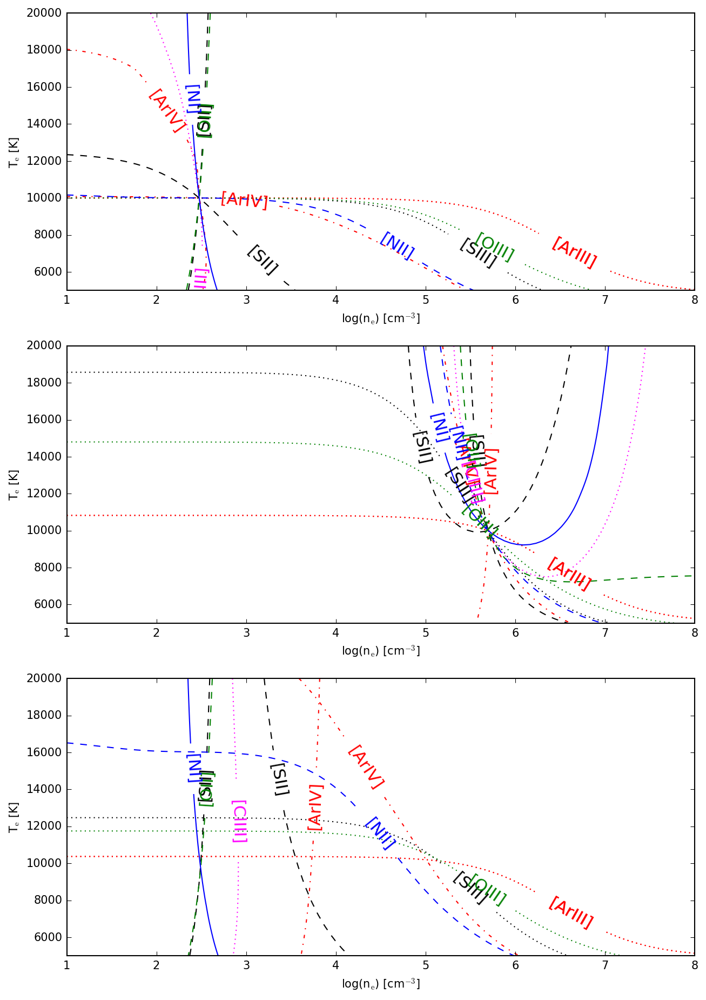

In [161]:
# Analysis plot of a simple two-component model, meant to illustrate the bias arising 
# from assuming that the region is homogeneous in density
# First, an emission region made up of two different subregions is modelled,
# each with a different mass and density. The resulting overall emissivity is computed
# Second, the region is analyzed as if it were a homogeneous region

import pyneb as pn
import matplotlib.pyplot as plt
from pyneb.utils.misc import parseAtom

def plot_2comp(tem1=1e4, tem2=1e4, dens1=3e2, dens2=5e5, mass1=1, mass2=5e-4):
        
    # List of diagnostics used to analyze the region
    diags = pn.Diagnostics()
    
    diags.addDiag(['[NI] 5198/5200',
                   '[NII] 5755/6548',
                    '[OII] 3726/3729',
                    '[OII] 3727+/7325+',
                    '[OIII] 4363/5007', 
                    '[ArIII] 5192/7136',
                    '[ArIII] 5192/7300+',
                    '[ArIV] 4740/4711',
                    '[ArIV] 7230+/4720+',
                    '[SII] 6731/6716', 
                    '[SII] 4072+/6720+',
                    '[SIII] 6312/9069',
                    '[ClIII] 5538/5518'
                    ])
    """    
    for diag in pn.diags_dict:
        if diag[0:7] != '[FeIII]':
            diags.addDiag(diag)
            print 'Adding', diag
    diags.addClabel('[SIII] 6312/9069', '[SIII]A')
    diags.addClabel('[OIII] 4363/5007', '[OIII]A')
    """    
    # Define all the ions that are involved in the diagnostics
    adict = diags.atomDict
    pn.log_.message('Atoms built')
    
    obs = pn.Observation(corrected = True)
    for atom in adict:
        # Computes all the intensities of all the lines of all the ions considered
         for line in pn.LINE_LABEL_LIST[atom]:
            if line[-1] == 'm':
                wavelength = float(line[:-1])*1e4
            else:
                wavelength = float(line[:-1])
            elem, spec = parseAtom(atom)
            intens1 = adict[atom].getEmissivity(tem1, dens1, wave = wavelength) * dens1 * mass1
            intens2 = adict[atom].getEmissivity(tem2, dens2, wave = wavelength) * dens2 * mass2
            obs.addLine(pn.EmissionLine(elem, spec, wavelength,
                                         obsIntens=[intens1, intens2, intens1+intens2], 
                                         obsError=[0.0, 0.0, 0.0]))
    
    pn.log_.message('Virtual observations computed')
    emisgrids = pn.getEmisGridDict(atomDict=adict)
    
    pn.log_.message('EmisGrids available')
    
    # Produce a diagnostic plot for each of the two regions and another one for the 
    # (misanalyzed) overall region
    f, axes = plt.subplots(3,1, figsize=(10,15))
    for i_obs in (0,1,2):
        diags.plot(emisgrids, obs, i_obs=i_obs, ax=axes[i_obs])

plot_2comp(tem1=1e4, tem2=1e4, dens1=3e2, dens2=5e5, mass1=1, mass2=5e-4)
plt.show()

# Diagnostic diagrams of a 2-components region¶

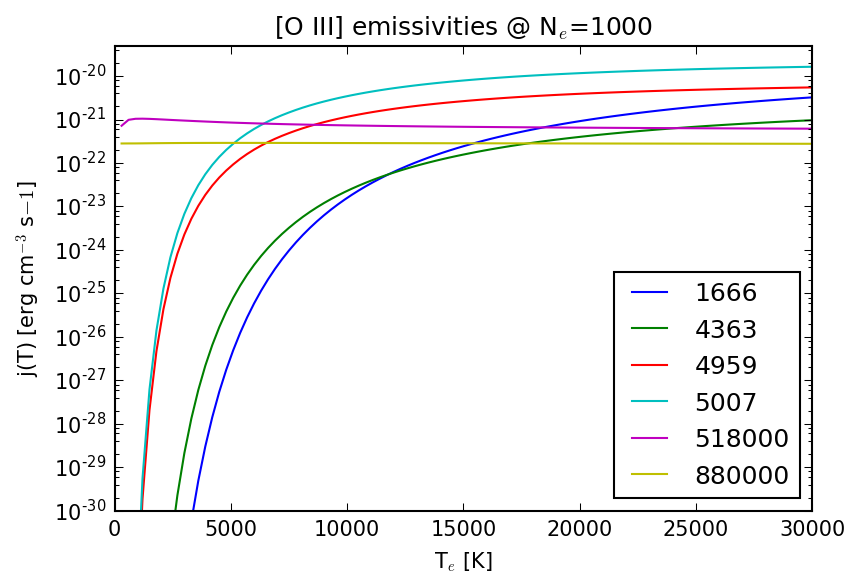

In [162]:
# Emissivity plot
# For a quick and dirty plot, see also o3.plotEmiss

# Imports
import pyneb as pn
import numpy as np
import matplotlib.pyplot as plt

# Atom creation and definition of physical conditions 
o3=pn.Atom('O', 3)
tem=np.arange(100)*300+300
den = 1000

# Comment the second if you want all the lines to be plotted
lineList=o3.lineList
lineList=[1666, 4363, 4959, 5007, 518000, 880000]

# Plot	
fig = plt.figure()
ax = fig.add_subplot(111)
ax.set_ylim([1.e-30, 5e-20])

for line in lineList:
    y=o3.getEmissivity(tem, den, wave=line)
    plt.semilogy(tem, y,  label="{:.0f}".format(line))

plt.xlabel('T$_e$ [K]')
plt.ylabel("j(T) [erg cm$^{-3}$ s${-1}$]")
plt.legend(loc='lower right')
plt.title('[O III] emissivities @ N$_e$={:.0f}'.format(den))
plt.show()

# Grotrian diagrams

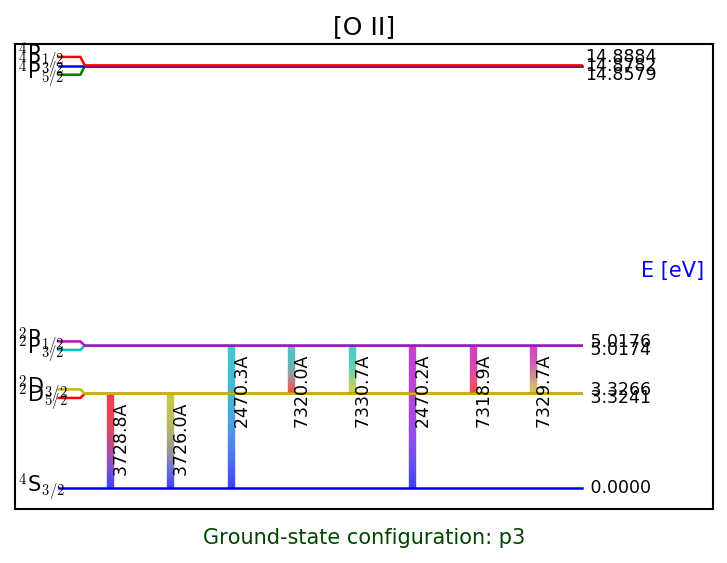

In [163]:
# Grotrian diagram of [O II]

# Imports
import pyneb as pn

# # Define the atom
o2=pn.Atom('O', 2)

# Draw the diagram
o2.plotGrotrian()
plt.show()

# Comparison of transition probabilities

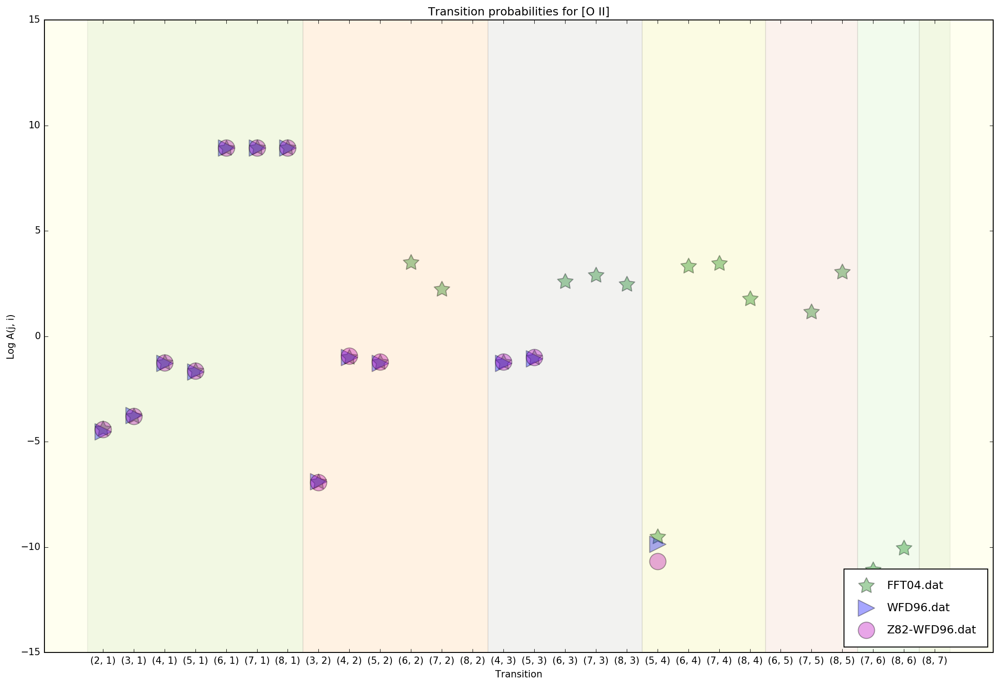

In [164]:
# Transition probabilities plot

# Imports
import pyneb as pn

# Define a dataplot object
dp=pn.DataPlot('O', 2)

# Plot data
dp.plotA()

# Comparison of collision strengths for a given ion

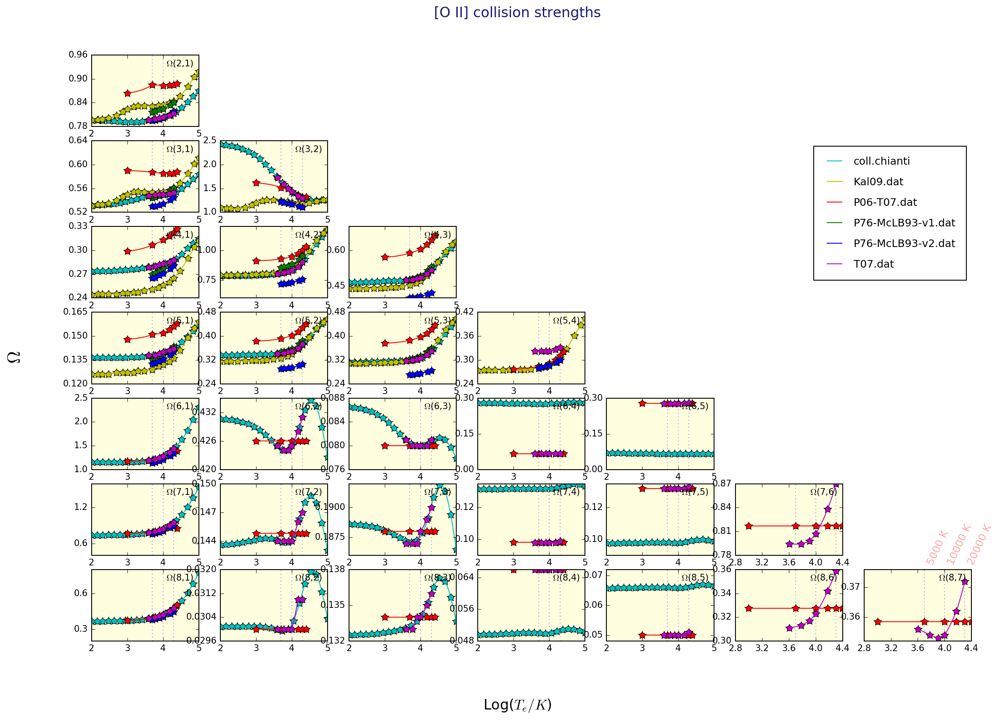

In [165]:
# Collision strength plot

# Imports
import pyneb as pn

# # Define a dataplot object
dp=pn.DataPlot('O', 2)

# Plot data
dp.plotOmega()

# Emissivity map of a line

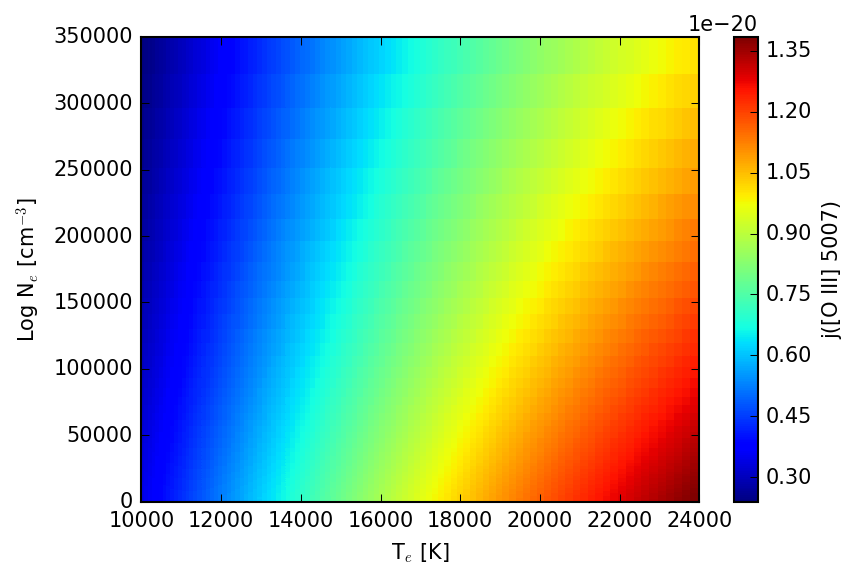

In [166]:
# Emissivity map of [O III] 5007 

# Imports
import pyneb as pn
import matplotlib.pyplot as plt

# Compute the grid 
map=pn.EmisGrid('O', 3, tem_min=10000, tem_max=23999.00, den_min=100, den_max=3.5e5, n_tem=100, n_den=100)
X=map.tem2D
Y=map.den2D
Z=map.getGrid(wave=5007)

# Plot
emap = plt.pcolor(X, Y, Z)
cbar = plt.colorbar(emap)
cbar.set_label('j([O III] 5007)')
plt.xlabel(r'T$_e$ [K]')
plt.ylabel(r'Log N$_e$ [cm$^{-3}$]')
plt.show()

# Emissivity map of a line ratio

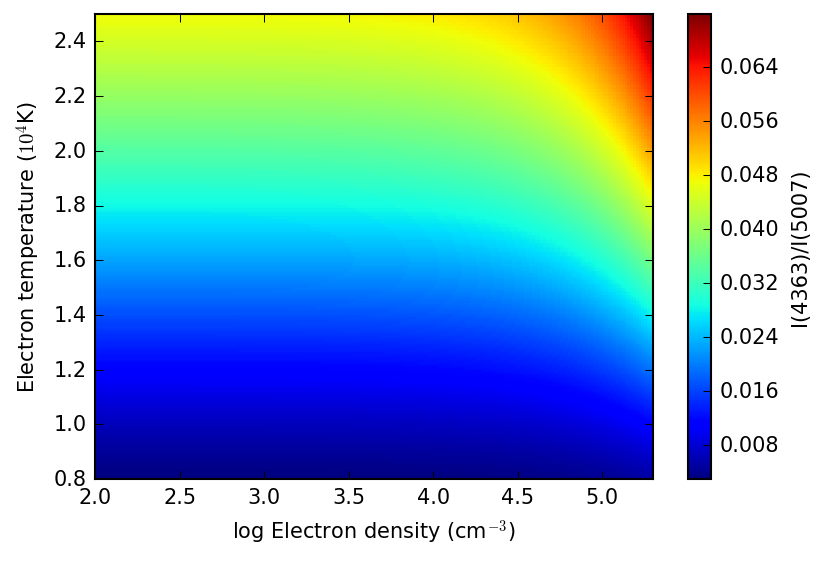

In [167]:
# Emissivity map of the [O III] 4363/5007 line ratio

# Imports
import pyneb as pn

# Compute the grid 
o3grid = pn.EmisGrid('O', 3, n_tem=200, n_den=200, tem_min=8000, tem_max=25000, den_min=100, den_max=2.e5)

# Plot the grid
o3grid.plotImage('L(4363)/L(5007)', cblabel='I(4363)/I(5007)')